## Fase 2 - Compreensão dos dados

In [12]:
#Importar as bibliotecas pandas e numpy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import skew

In [13]:
#Ler o ficheiro (Data2001_now.csv)
dataset = pd.read_csv("Data2001_now.csv")
# Ver as 5 primeiras linhas do dataset
dataset.head(5)

<ipython-input-13-a0bca5afecbb>:2: DtypeWarning: Columns (6,7,8,25,26,27,28,38,99) have mixed types. Specify dtype option on import or set low_memory=False.
  dataset = pd.read_csv("Data2001_now.csv")


,Unnamed: 0,Codigo,CodigoSado,Ano,Tipo,DHInicio,DH1Intervencao,DHResolucao,DHConclusao,DHFim,...,NIncSimul500090,DistIncSimul500090,AreaTotalIncSimul500090,Fogacho,Agricola,Reacendimentos,ClassificacaoRegisto,EstadoRegisto,DHFimEstimado,Observacoes
0,1,2022_01_0005414,2.022010e+12,2022,Agrícola,2022-01-19 17:28:00,2022-01-19 17:40:00,NaN,2022-01-19 17:57:00,2022-01-19 17:58:00,...,1.0,0.0,0.0010,0,1,0,Closed,NaN,2022-01-19 17:58:00,NaN
1,2,2022_01_0006195,2.022010e+12,2022,Florestal,2022-01-21 21:41:00,2022-01-21 22:10:00,2022-01-22 02:37:00,2022-01-22 03:56:00,2022-01-22 03:57:00,...,1.0,0.0,28.0000,0,0,0,Closed,NaN,2022-01-22 03:57:00,NaN
2,3,2022_01_0006208,2.022010e+12,2022,Florestal,2022-01-21 22:00:00,2022-01-21 22:10:00,2022-01-21 23:05:00,2022-01-21 23:49:00,2022-01-21 23:50:00,...,1.0,0.0,0.1207,1,0,0,Closed,NaN,2022-01-21 23:50:00,NaN
3,4,2022_01_0006319,2.022010e+12,2022,Florestal,2022-01-22 11:33:00,2022-01-22 12:08:00,2022-01-22 12:47:00,2022-01-22 13:55:00,2022-01-22 13:56:00,...,1.0,0.0,0.4541,1,0,0,Closed,NaN,2022-01-22 13:56:00,NaN
4,5,2022_01_0006450,2.022010e+12,2022,Florestal,2022-01-22 20:55:00,2022-01-22 21:05:00,2022-01-22 21:23:00,2022-01-22 21:53:00,2022-01-22 21:54:00,...,1.0,0.0,0.1100,1,0,0,Closed,NaN,2022-01-22 21:54:00,NaN


### Etapa 3 - Exploração dos dados

In [14]:
# Mostrar todas as colunas e linhas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [15]:
#tamanho da bd
dataset.shape

(486715, 100)

### 2.3.1 - Estatisticas descritivas das variáveis conitnuas

In [16]:
#Como haviam muitas variáveis, decidiu ser feita uma divisão das variáveis por 3 grupos para analisar


#### Grupo 1

In [17]:
# Grupo 1
variaveis_num_continuas = ['DuracaoHoras', 'Tempo1Intervencao', 'TempoResolucao', 'TempoRescaldo','AreaPov', 'AreaMato', 'AreaAgric', 'AreaTotal', 'AltitudeMedia', 'DecliveMedio',
                'HorasExposicaoMedia', 'Rugosidade', 'Temperatura', 'HumidadeRelativa','VentoIntensidade', 'Perigosidade', 'Precepitacao']

# .agg -> aplica várias funções ao mesmo tempo (Média, Mediana, desvio-padrao, minimo, maximo)
estatisticas_variaveis_num_continuas = dataset[variaveis_num_continuas].agg(['mean', 'median', 'std', 'max', 'min'])
estatisticas_variaveis_num_continuas = estatisticas_variaveis_num_continuas.round(2) #arredondar casas decimais
print(estatisticas_variaveis_num_continuas)


        DuracaoHoras  Tempo1Intervencao  TempoResolucao  TempoRescaldo  \
mean            1.95              12.82           75.13          70.96   
median          1.03              12.00           90.00          90.00   
std             7.99               8.26           71.87          73.13   
max          2474.32             120.00         9829.00       17121.00   
min             0.00               0.00            0.00           0.00   

         AreaPov  AreaMato  AreaAgric  AreaTotal  AltitudeMedia  DecliveMedio  \
mean        3.27      2.85       0.47       6.59         278.61         14.02   
median      0.00      0.01       0.00       0.05         207.43         12.20   
std       144.29     69.97      22.56     204.11         242.81          9.22   
max     47215.43  15647.00    5675.65   53618.81        1848.80         82.34   
min         0.00      0.00       0.00       0.00         -64.21          0.00   

        HorasExposicaoMedia  Rugosidade  Temperatura  HumidadeRelati

In [18]:
# Ver o tipo das variaveis para garantir que estão com no tipo certo
dataset[variaveis_num_continuas].dtypes

,0
DuracaoHoras,float64
Tempo1Intervencao,int64
TempoResolucao,int64
TempoRescaldo,int64
AreaPov,float64
AreaMato,float64
AreaAgric,float64
AreaTotal,float64
AltitudeMedia,float64
DecliveMedio,float64


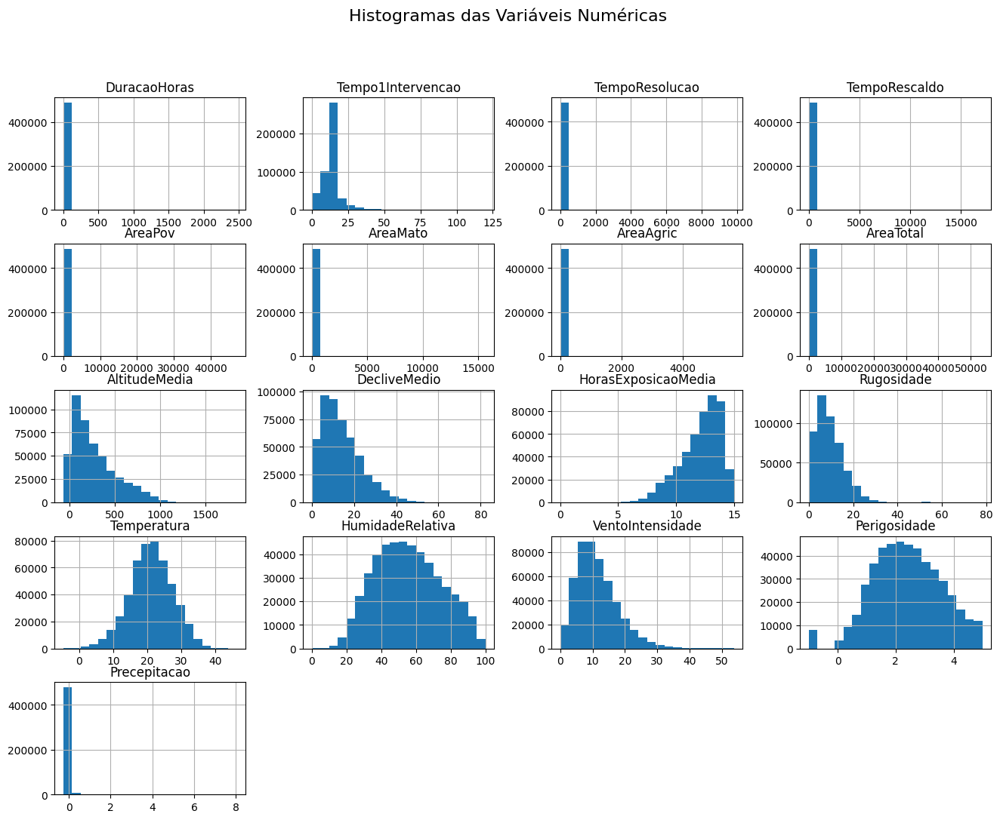

In [19]:
# Histograma para ver a distribuição
dataset[variaveis_num_continuas].hist(bins=20, figsize=(16, 12))
plt.suptitle('Histogramas das Variáveis Numéricas', fontsize=16)
plt.show()

Os histogramas mostraram que variáveis como DuracaoHoras, Precipitacao, os tempos (Tempo1Intervencao, TempoResolucao, TempoRescaldo) e as áreas (AreaPov, AreaMato, AreaAgric, AreaTotal) apresentaram distribuições bastante assimétricas, com cauda à direita, ou seja, a maior parte dos registos está concentrada em valores baixos, com poucos eventos que assumem valores muito elevados.

Por outro lado, variáveis como AltitudeMedia, DecliveMedio, Rugosidade, HorasExposicaoMedia e VentoIntensidade apresentaram distribuições mais amplas, com dispersão considerável dos dados, embora ainda com alguma assimetria. Esses atributos relacionados ao relevo e às condições ambientais variam de forma mais gradual entre os registros e refletem as diferentes características topográficas e climáticas das regiões afetadas.

As variáveis com distribuição mais próxima da simetria foram Temperatura, HumidadeRelativa e Perigosidade. Essas sugerem uma dispersão mais equilibrada em torno da média, sem caudas excessivamente alongadas, o que facilita o tratamento estatístico posterior e indica que essas variáveis possuem variação mais estável entre os eventos analisados.

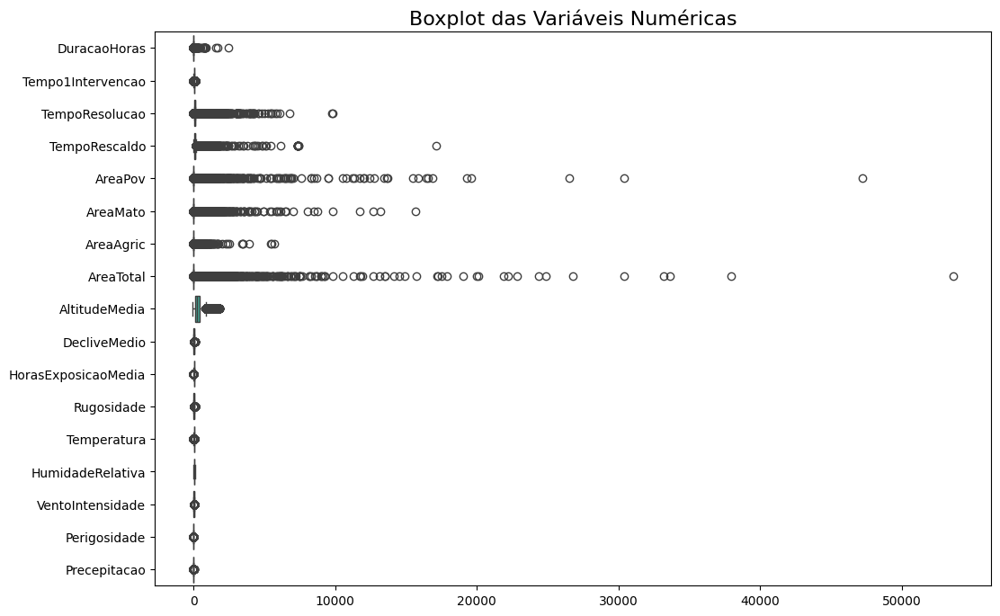

In [20]:
# Boxplot para ter uma visão rápida da dispersão e possíveis outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=dataset[variaveis_num_continuas], orient='h')
plt.title('Boxplot das Variáveis Numéricas', fontsize=16)
plt.show()

A análise do boxplot reforça esses achados, revelando uma grande quantidade de valores atípicos (outliers) nas variáveis de tempo e área, como DuracaoHoras, TempoResolucao e AreaTotal. Esses outliers indicam ocorrências com características extremas, que podem distorcer medidas como a média e afetar modelos sensíveis a essas variações. Já variáveis como Temperatura, HumidadeRelativa e Perigosidade demonstraram menor presença de outliers e maior consistência nos dados. A diferença de escalas entre variáveis também é evidente no boxplot e destaca a importância de aplicar padronizações ou normalizações antes da modelagem, principalmente em algoritmos que dependem de distâncias ou magnitudes comparáveis.

Matriz de Correlação do grupo das variaveis mais relevantes

In [21]:
# Calcular e exibir a matriz de correlacao
corr_matrix1 = dataset[variaveis_num_continuas].corr().round(2)
print(corr_matrix1)

                     DuracaoHoras  Tempo1Intervencao  TempoResolucao  \
DuracaoHoras                 1.00               0.05            0.25   
Tempo1Intervencao            0.05               1.00            0.02   
TempoResolucao               0.25               0.02            1.00   
TempoRescaldo                0.27              -0.02            0.36   
AreaPov                      0.21               0.00            0.36   
AreaMato                     0.27               0.02            0.39   
AreaAgric                    0.14               0.00            0.21   
AreaTotal                    0.26               0.01            0.41   
AltitudeMedia                0.07               0.14            0.06   
DecliveMedio                 0.06               0.11            0.07   
HorasExposicaoMedia         -0.01              -0.18           -0.03   
Rugosidade                   0.06               0.11            0.07   
Temperatura                  0.05              -0.15            

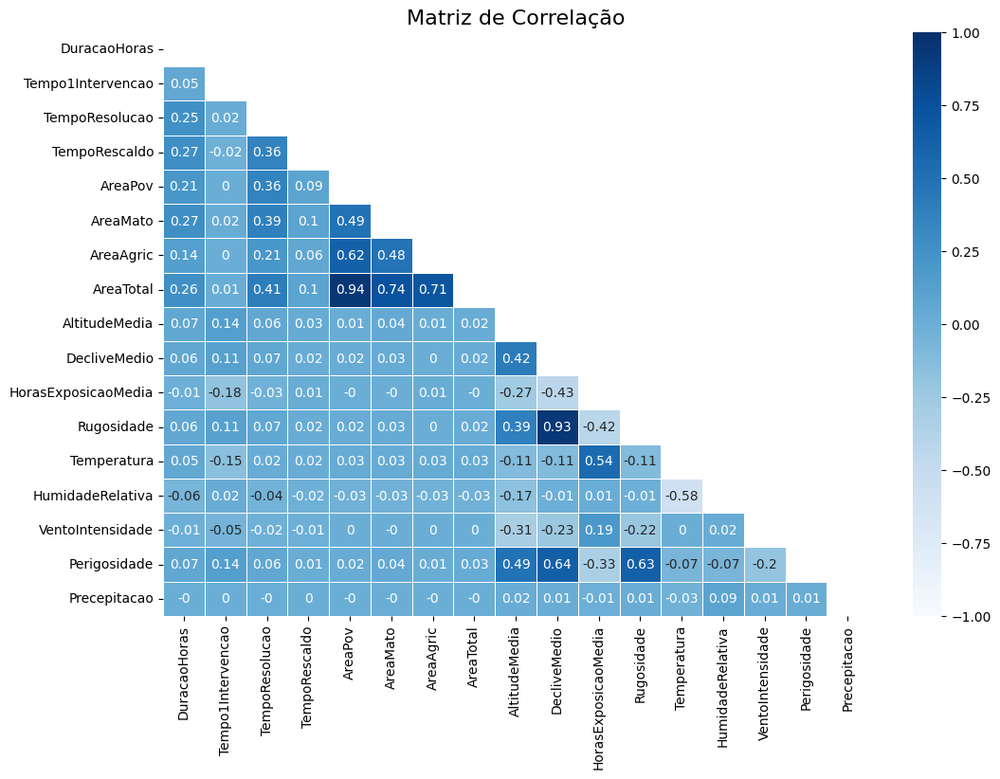

In [22]:
# Para visualizar melhor as correlaçoes vamos visualizar com um heatmap:
mask = np.triu(np.ones_like(corr_matrix1, dtype=bool)) # Criar uma mascara para ocultar os valores de um dos lados da diagonal (facilita a visualizaçao)
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix1, mask=mask, annot=True, cmap='Blues', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Matriz de Correlação', fontsize=16)
plt.show()

#### Grupo 2

Estatísticas

In [23]:
# Grupo 2: Características do incêndio e do contexto operacional
variaveis_num_continuas2 = [
    'HaHora', 'Dist_CBS_m', 'DensidadeResidentes', 'DensidadeEdificios',
    'VentoDirecao', 'AreaTotalIncSimul5000', 'NIncSimulDistrito', 'NIncSimulConcelho',
    'MaxISIh_48h_PosExtincao']

In [24]:
# Ver o tipo das variaveis para garantir que estão com no tipo certo
dataset[variaveis_num_continuas2].dtypes

,0
HaHora,float64
Dist_CBS_m,float64
DensidadeResidentes,float64
DensidadeEdificios,float64
VentoDirecao,float64
AreaTotalIncSimul5000,float64
NIncSimulDistrito,float64
NIncSimulConcelho,float64
MaxISIh_48h_PosExtincao,float64


In [25]:
# Estatísticas descritivas
estatisticas2 = dataset[variaveis_num_continuas2].agg(['mean', 'median', 'std', 'max', 'min']).round(2)
print("Estatísticas descritivas – Grupo 2")
print(estatisticas2)

Estatísticas descritivas – Grupo 2
         HaHora  Dist_CBS_m  DensidadeResidentes  DensidadeEdificios  \
mean       0.75     4607.04                12.30                4.32   
median     0.07     3964.00                 2.45                1.19   
std       17.75     6949.85                35.18                9.75   
max     7440.00  3141387.00               961.31              164.76   
min        0.00        0.00                 0.00                0.00   

        VentoDirecao  AreaTotalIncSimul5000  NIncSimulDistrito  \
mean          214.06                   7.57               3.70   
median        267.36                   0.05               2.00   
std           119.08                 215.05               9.53   
max           360.00               53618.81            1035.00   
min             0.00                   0.00               0.00   

        NIncSimulConcelho  MaxISIh_48h_PosExtincao  
mean                 1.30                     7.52  
median               1.00    

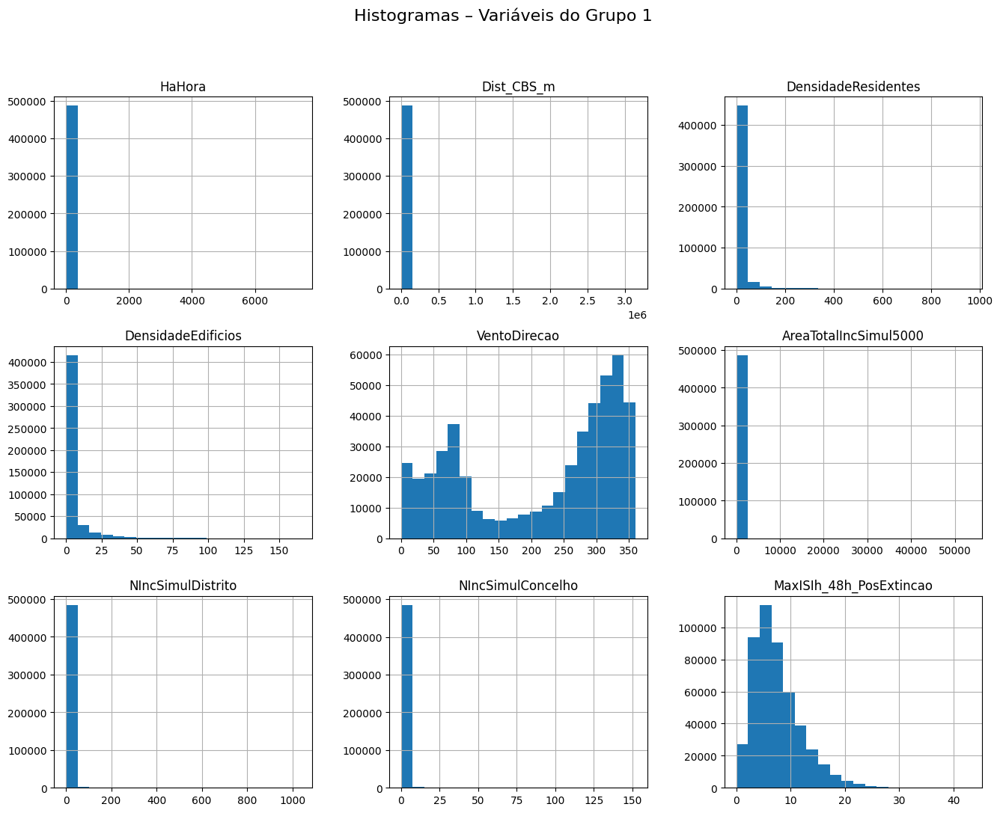

In [26]:
# Histogramas
dataset[variaveis_num_continuas2].hist(bins=20, figsize=(16, 12))
plt.suptitle('Histogramas – Variáveis do Grupo 1', fontsize=16)
plt.show()

Distribuições altamente assimétricas à direita:
HaHora, Dist_CBS_m, DensidadeResidentes, DensidadeEdificios, AreaTotalIncSimul5000, NIncSimulDistrito, NIncSimulConcelho, MaxISIh_48h_PosExtincao
Essas variáveis concentram a maior parte dos valores em torno de zero, com valores extremos muito elevados, sugerindo presença de outliers e necessidade de transformação logarítmica ou normalização para análise futura.

Distribuição aproximadamente "uniforme":
VentoDirecao apresenta uma distribuição circular, como esperado de uma variável direcional (em graus de 0 a 360), usada frequentemente em análise vetorial de vento.

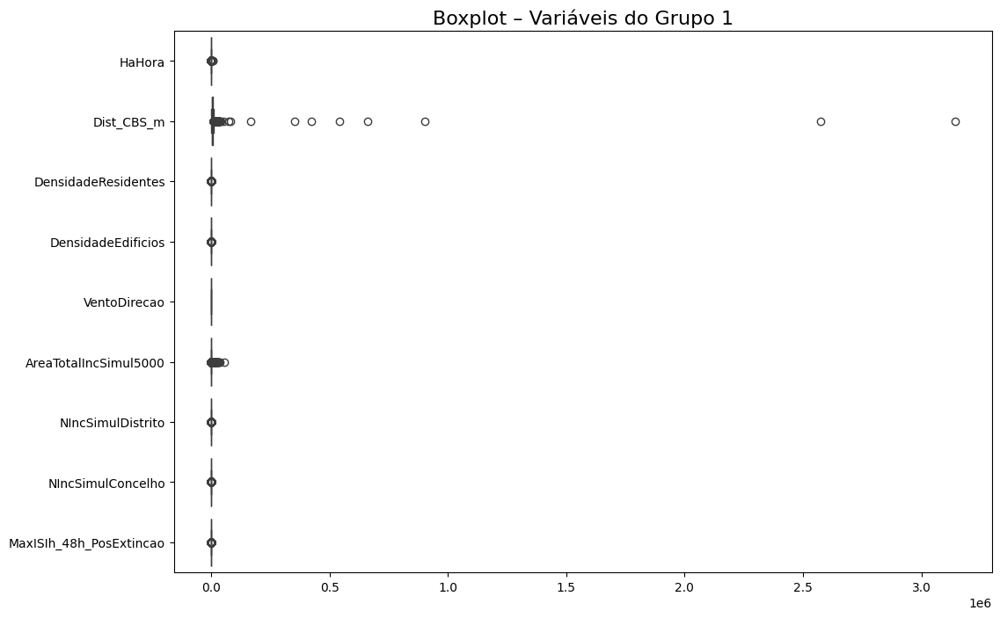

In [27]:
# Boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(data=dataset[variaveis_num_continuas2], orient='h')
plt.title('Boxplot – Variáveis do Grupo 1', fontsize=16)
plt.show()

O grupo de variáveis apresenta distribuições assimétricas e caudas longas.
O tratamento de outliers será necessário e terá de ser aplicado normalizaçao dos dados antes de avançar para modelos.

Gráfico de Correlação entre Variáveis

In [28]:
# Matriz de correlação
corr_matrix2 = dataset[variaveis_num_continuas2].corr().round(2)
print("Matriz de Correlação – Grupo 1")
print(corr_matrix2)

Matriz de Correlação – Grupo 1
                         HaHora  Dist_CBS_m  DensidadeResidentes  \
HaHora                     1.00        0.01                -0.01   
Dist_CBS_m                 0.01        1.00                -0.09   
DensidadeResidentes       -0.01       -0.09                 1.00   
DensidadeEdificios        -0.01       -0.04                 0.54   
VentoDirecao              -0.01       -0.02                 0.07   
AreaTotalIncSimul5000      0.25        0.01                -0.01   
NIncSimulDistrito          0.02       -0.01                -0.02   
NIncSimulConcelho          0.02       -0.01                -0.02   
MaxISIh_48h_PosExtincao    0.02        0.03                 0.03   

                         DensidadeEdificios  VentoDirecao  \
HaHora                                -0.01         -0.01   
Dist_CBS_m                            -0.04         -0.02   
DensidadeResidentes                    0.54          0.07   
DensidadeEdificios                     1.00 

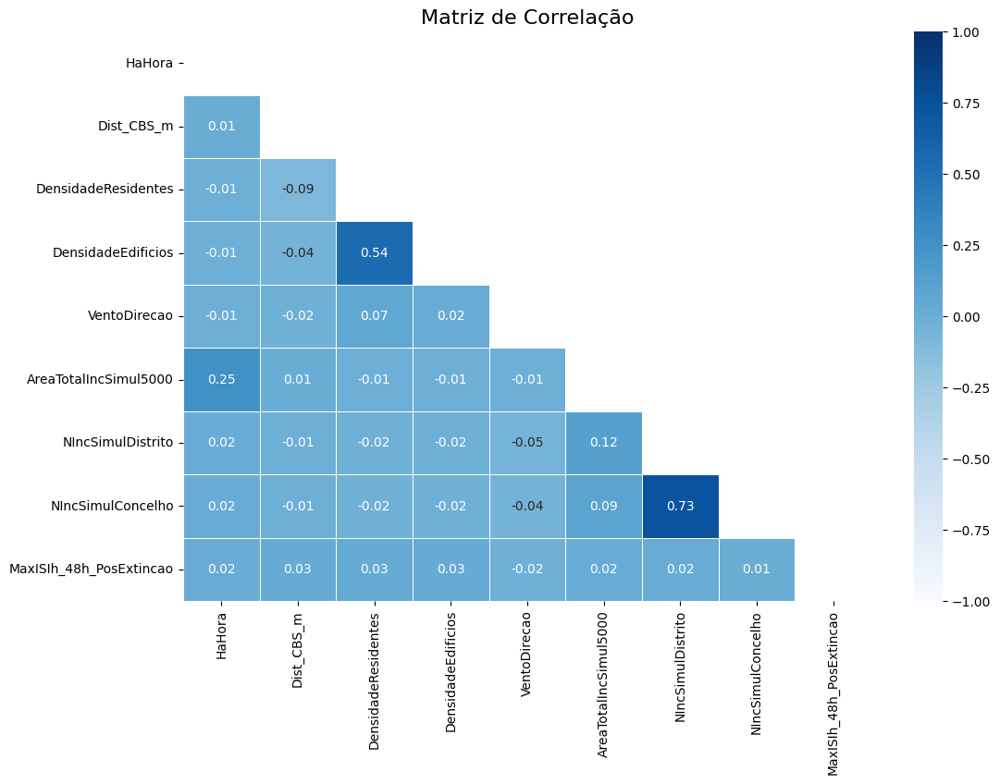

In [29]:
# Para visualizar melhor as correlaçoes vamos visualizar com um heatmap:
mask = np.triu(np.ones_like(corr_matrix2, dtype=bool)) # Criar uma mascara para ocultar os valores de um dos lados da diagonal (facilita a visualizaçao)
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix2, mask=mask, annot=True, cmap='Blues', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Matriz de Correlação', fontsize=16)
plt.show()

A matriz de correlação mostra que, de forma geral, as variáveis do Grupo 2 apresentam correlações fracas entre si, com a maioria dos coeficientes próximos de 0. Isto indica que não há relações lineares fortes entre estas variáveis, à exceção de 2 casos:
- NIncSimulDistrito e NIncSimulConcelho — o que é esperado, uma vez que incêndios simultâneos num concelho contribuem diretamente para os totais no distrito
- DensidadeResidentes e DensidadeEdificios, o que também é lógico, já que zonas com mais edifícios tendem a concentrar mais população

#### Grupo 3

Estatisticas

In [30]:
variaveis_num_continuas3 = [
    'fwi', 'dsr', 'isi', 'dc', 'dmc', 'ffmc', 'bui',
    'MaxFWIh_48h_PosExtincao', 'MaxFFMCh_48h_PosExtincao'
]

In [31]:
# Estatísticas descritivas
estatisticas3 = dataset[variaveis_num_continuas3].agg(['mean', 'median', 'std', 'max', 'min']).round(2)
print("Estatísticas descritivas – Grupo 2")
print(estatisticas3)

Estatísticas descritivas – Grupo 2
           fwi    dsr    isi       dc     dmc   ffmc     bui  \
mean     21.37   7.64   6.54   470.27   81.99  87.52  107.88   
median   20.60   5.76   5.97   481.60   66.02  88.57   95.34   
std      12.78   7.30   3.60   278.52   68.83   6.62   79.03   
max     101.26  96.42  49.51  1798.09  716.23  98.92  713.88   
min     -80.00   0.00 -80.00   -80.00  -80.00 -80.00  -80.00   

        MaxFWIh_48h_PosExtincao  MaxFFMCh_48h_PosExtincao  
mean                      23.75                     87.20  
median                    21.96                     87.78  
std                       14.75                      5.86  
max                       97.00                     99.18  
min                        0.00                      1.89  


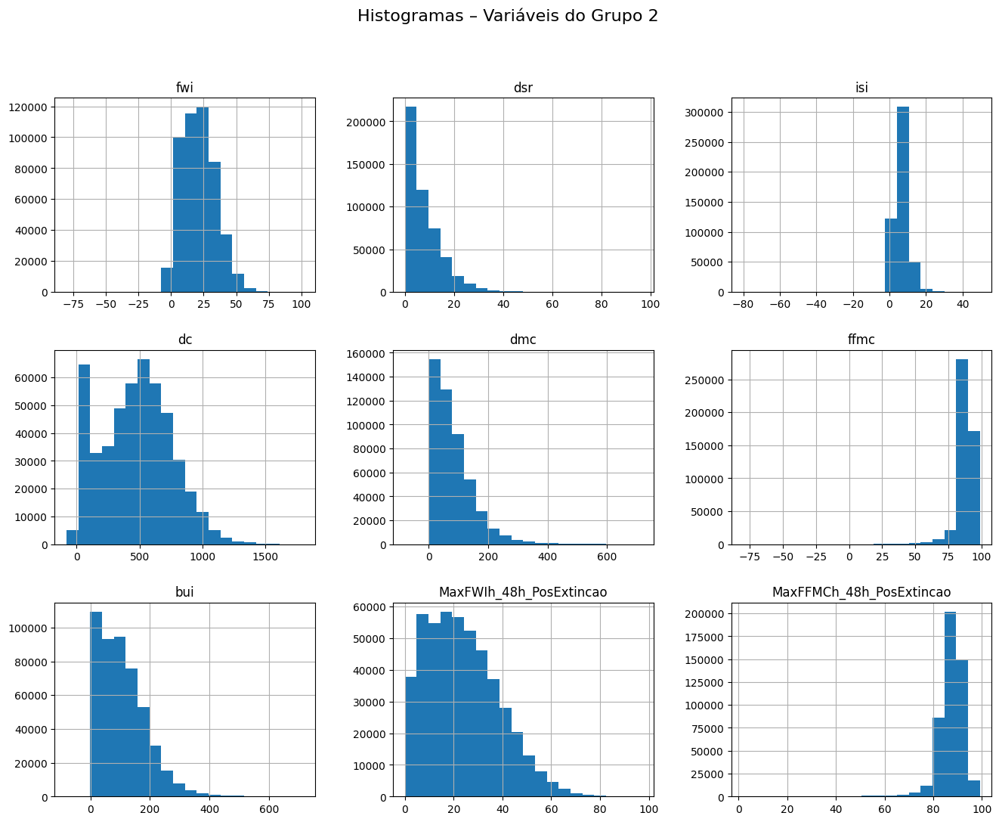

In [32]:
# Histogramas
dataset[variaveis_num_continuas3].hist(bins=20, figsize=(16, 12))
plt.suptitle('Histogramas – Variáveis do Grupo 2', fontsize=16)
plt.show()

Distribuições assimétricas à direita -  dsr, isi, dmc, bui, MaxFWIh_48h_PosExtincao, MaxFFMCh_48h_PosExtincao
Apresentam uma alta concentração de valores baixos, com uma cauda longa de valores mais elevados.

Distribuições concentradas em faixas altas - ffmc e MaxFFMCh_48h_PosExtincao
comum em épocas críticas de incêndios

Distribuições mais equilibradas: fwi e dc apresentam distribuições mais espalhadas, embora ainda com tendência à assimetria

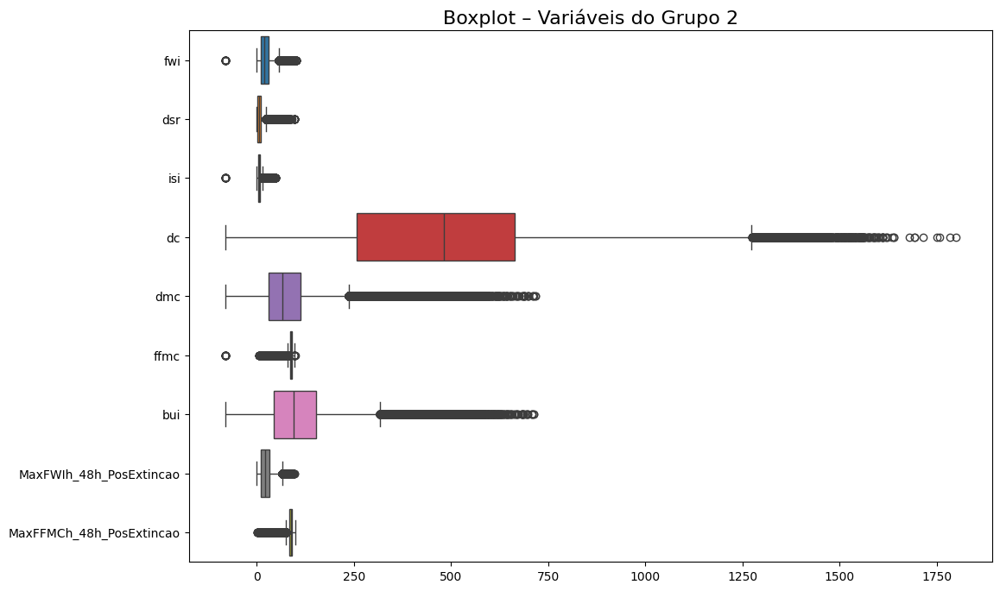

In [33]:
# Boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(data=dataset[variaveis_num_continuas3], orient='h')
plt.title('Boxplot – Variáveis do Grupo 2', fontsize=16)
plt.show()

O boxplot revela uma presença significativa de outliers em praticamente todas as variáveis, com diferentes graus de dispersão e assimetria, refletindo as variações extremas nas condições meteorológicas associadas aos incêndios.

Gráfico de Correlação entre Variáveis

In [34]:
# Matriz de correlação
corr_matrix3 = dataset[variaveis_num_continuas3].corr().round(2)
print("Matriz de Correlação – Grupo 2")
print(corr_matrix3)

Matriz de Correlação – Grupo 2
                           fwi   dsr   isi    dc   dmc  ffmc   bui  \
fwi                       1.00  0.96  0.87  0.61  0.72  0.62  0.75   
dsr                       0.96  1.00  0.88  0.55  0.68  0.52  0.70   
isi                       0.87  0.88  1.00  0.29  0.43  0.64  0.42   
dc                        0.61  0.55  0.29  1.00  0.69  0.23  0.80   
dmc                       0.72  0.68  0.43  0.69  1.00  0.35  0.98   
ffmc                      0.62  0.52  0.64  0.23  0.35  1.00  0.35   
bui                       0.75  0.70  0.42  0.80  0.98  0.35  1.00   
MaxFWIh_48h_PosExtincao   0.86  0.82  0.68  0.59  0.71  0.51  0.74   
MaxFFMCh_48h_PosExtincao  0.52  0.47  0.52  0.20  0.31  0.63  0.31   

                          MaxFWIh_48h_PosExtincao  MaxFFMCh_48h_PosExtincao  
fwi                                          0.86                      0.52  
dsr                                          0.82                      0.47  
isi                               

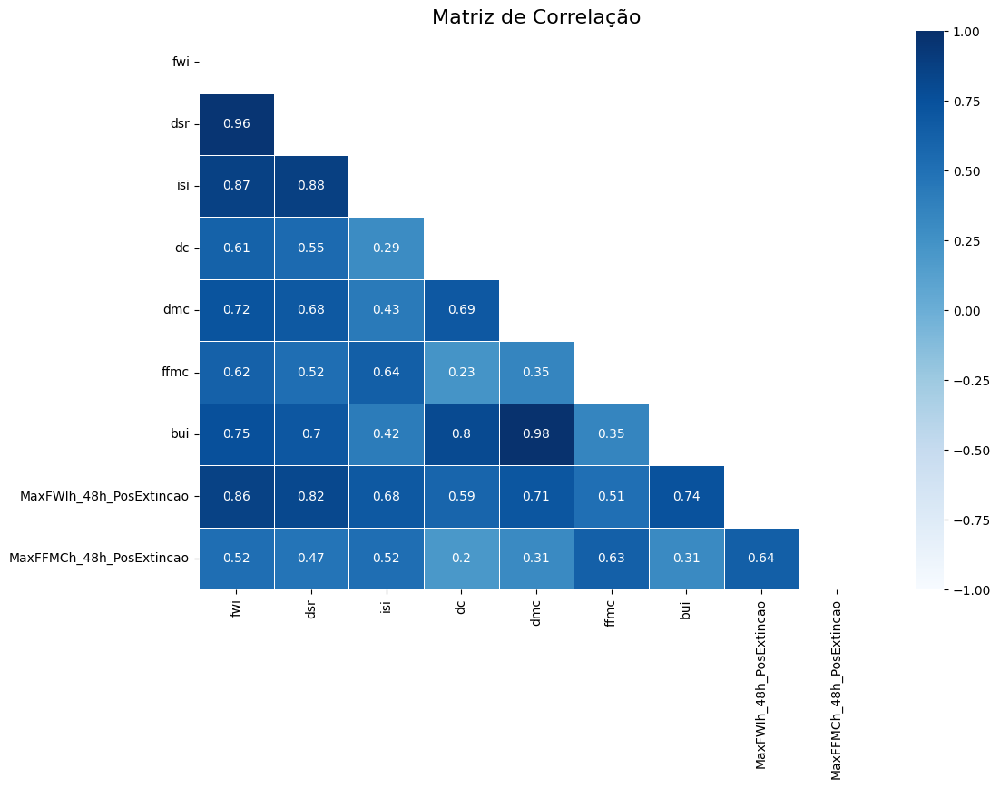

In [35]:
# Para visualizar melhor as correlaçoes vamos visualizar com um heatmap:
mask = np.triu(np.ones_like(corr_matrix3, dtype=bool)) # Criar uma mascara para ocultar os valores de um dos lados da diagonal (facilita a visualizaçao)
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix3, mask=mask, annot=True, cmap='Blues', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Matriz de Correlação', fontsize=16)
plt.show()

A matriz revela correlações fortes e positivas entre muitos dos índices utilizados para caracterizar o risco e comportamento do fogo.
Existe multicolinearidade entre vários índices, especialmente entre fwi, dsr, isi, bui, o que requer atenção na modelação.
As variáveis pós-extinção (MaxFWIh e MaxFFMCh) correlacionam-se bem com os índices de risco ativos, o que valida o seu uso em modelos de reacendimento

Dist_CBS_m e Tempo1Intervencao

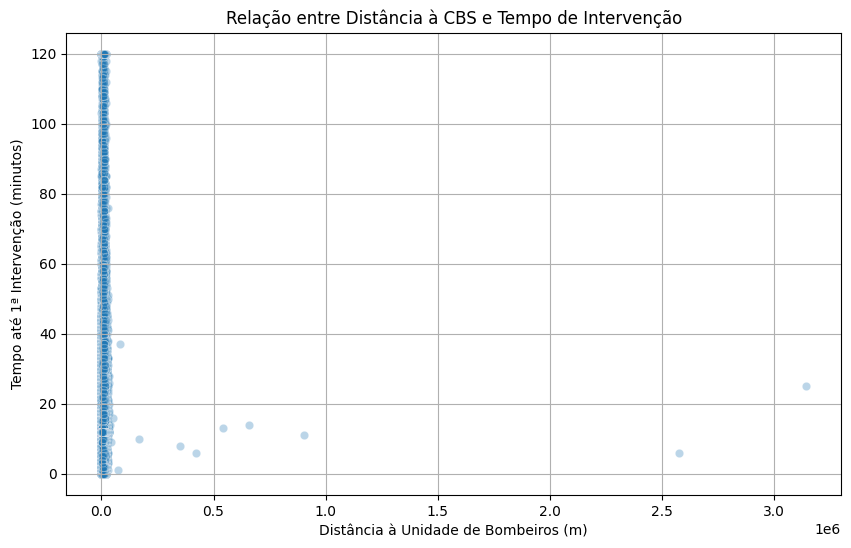

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dataset, x='Dist_CBS_m', y='Tempo1Intervencao', alpha=0.3)
plt.title('Relação entre Distância à CBS e Tempo de Intervenção')
plt.xlabel('Distância à Unidade de Bombeiros (m)')
plt.ylabel('Tempo até 1ª Intervenção (minutos)')
plt.grid(True)
plt.show()

Embora a lógica leve a esperar que maiores distâncias impliquem maiores tempos de intervenção, os dados reais não confirmam uma correlação forte entre estas duas variáveis, apontando para a influência de outros fatores operacionais. A remoção ou tratamento de outliers na variável de distância poderá ajudar a clarificar melhor esta relação.

### 2.3.2 - Análise exploratória das variáveis qualitativas
A função analisar_qualitativas realiza a análise exploratória das variáveis qualitativas do dataset. Para cada variável, apresenta a tabela de frequências absolutas e relativas, bem como os respetivos gráficos de barras e de pizza. As variáveis consideradas para esta análise são: Tipo, ClasseArea, CodCausa, TipoCausa, GrupoCausa, Distrito, Nut2, Fogacho, Agricola e Reacendimentos.

In [37]:
def analisar_qualitativas(dataset, lista_colunas):
    # Para cada coluna na lista
    for coluna in lista_colunas:
        # Substituição de 0/1 por "Não"/"Sim" para colunas binárias
        if dataset[coluna].dropna().isin([0, 1]).all():
          dataset[coluna] = dataset[coluna].replace({0: 'Não', 1: 'Sim'})

        print(f"\nAnálise da variável: {coluna}\n")

        # Agrupar os dados (Tabela de frequências absolutas)
        agrupado = dataset.groupby(coluna).size()

        # Tabela de frequência relativa
        agrupado_percent = (agrupado / agrupado.sum()) * 100

        # Combinação das tabelas de frequências absolutas com a tabela de frequência relativa
        tabela_combinada = pd.DataFrame({
            'Frequência Absoluta': agrupado,
            'Frequência Relativa (%)': agrupado_percent.round(2).astype(str) + ' %'
        })
        print(tabela_combinada)

        # Gráfico de Barras
        agrupado.plot(kind="bar", legend=True)
        plt.title(f"Gráfico de Barras - {coluna}")
        plt.xlabel(coluna)
        plt.ylabel("Frequência")
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

        # Gráfico de Pizza
        agrupado.plot.pie(legend=True)
        plt.title(f"Gráfico de Pizza - {coluna}")
        plt.ylabel("")
        plt.show()


Análise da variável: Tipo

           Frequência Absoluta Frequência Relativa (%)
Tipo                                                  
Agrícola                 85676                  17.6 %
Florestal               401026                 82.39 %
Queima                      13                   0.0 %


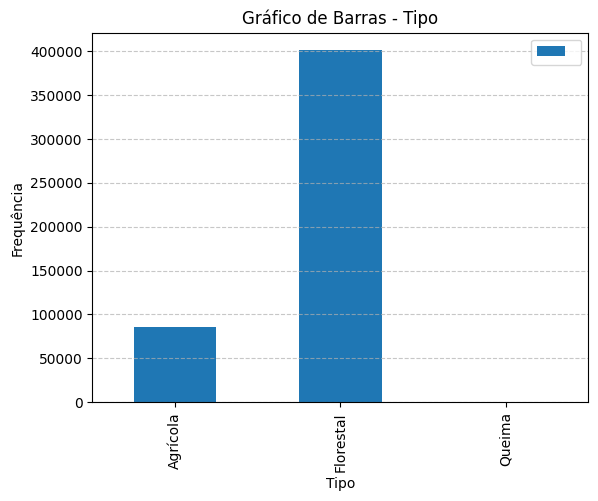

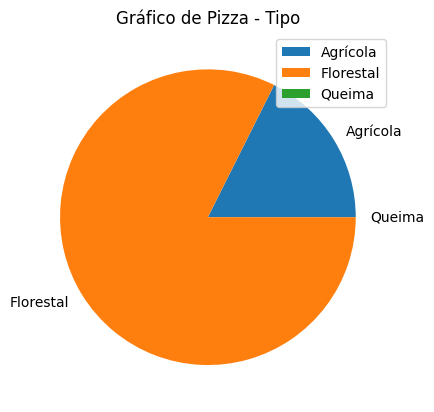


Análise da variável: ClasseArea

                Frequência Absoluta Frequência Relativa (%)
ClasseArea                                                 
[Area+1000]                     473                   0.1 %
[Area-1]                     415310                 85.33 %
[Area-50-100]                  2181                  0.45 %
[Area1-10]                    56796                 11.67 %
[Area10-50]                    9156                  1.88 %
[Area100-500]                  2341                  0.48 %
[Area500-1000]                  458                  0.09 %


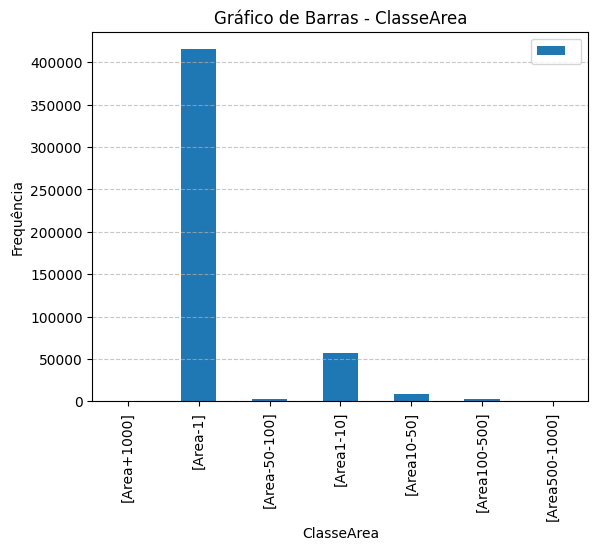

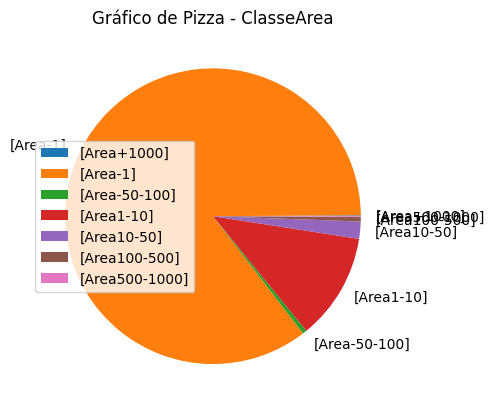


Análise da variável: FonteAlerta

                             Frequência Absoluta Frequência Relativa (%)
FonteAlerta                                                             
112                                        32184                  6.63 %
117                                        51802                 10.67 %
Autarquias                                     4                   0.0 %
BAV                                            3                   0.0 %
BRISA                                          1                   0.0 %
BT                                             4                   0.0 %
Bombeiros                                    210                  0.04 %
CB                                          1018                  0.21 %
CCO                                        40701                  8.38 %
CDOS                                         581                  0.12 %
CM                                            24                   0.0 %
CNGF            

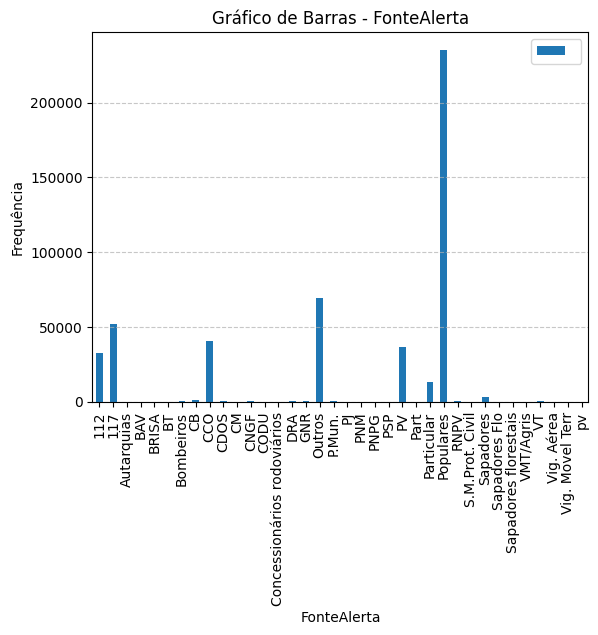

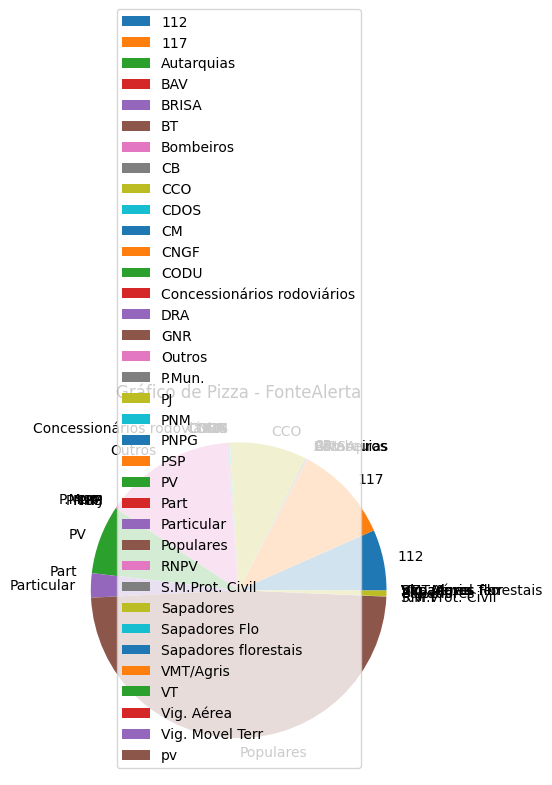


Análise da variável: TipoCausa

               Frequência Absoluta Frequência Relativa (%)
TipoCausa                                                 
Desconhecida                 82019                 34.26 %
Intencional                  46069                 19.24 %
Natural                       1970                  0.82 %
Negligente                   80657                 33.69 %
Reacendimento                28714                 11.99 %


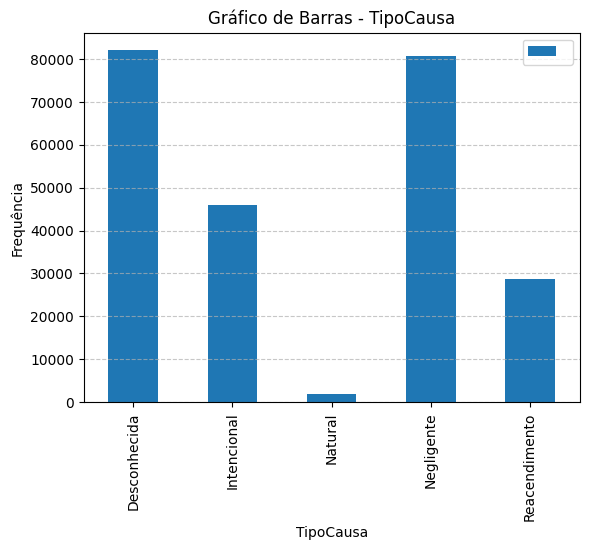

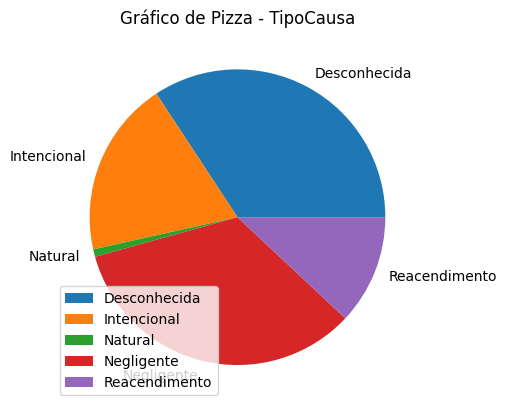


Análise da variável: GrupoCausa

                                                    Frequência Absoluta  \
GrupoCausa                                                                
Acidentais - Maquinaria                                            4389   
Acidentais - Outros                                                3878   
Acidentais - Transportes e Comunicações                            5346   
Estruturais - Caça e vida selvagem                                 1030   
Estruturais - Outras                                                340   
Estruturais - Uso do solo                                           688   
Incendiarismo - Imputáveis                                        40401   
Incendiarismo - Inimputáveis                                        413   
Incendiarismo - Sem motivação conhecida                            3197   
Indeterminadas                                                    82019   
Naturais                                                          

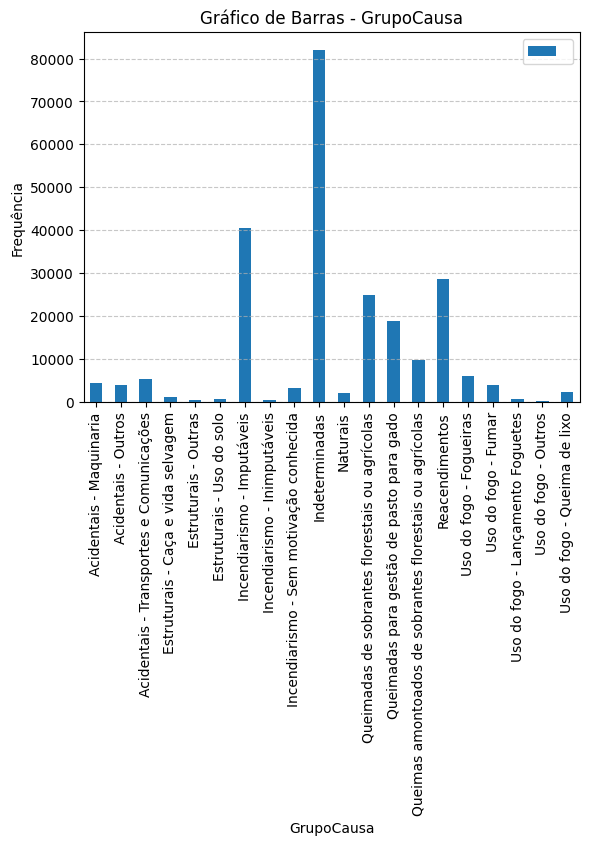

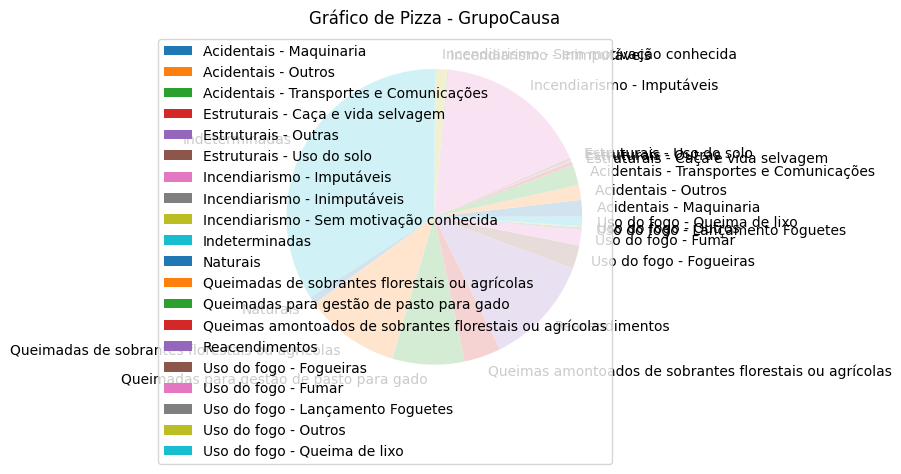


Análise da variável: Distrito

                  Frequência Absoluta Frequência Relativa (%)
Distrito                                                     
Aveiro                          40338                  8.29 %
Beja                             6937                  1.43 %
Braga                           55697                 11.45 %
Bragança                        15947                  3.28 %
Castelo Branco                  12637                   2.6 %
Coimbra                         14869                  3.06 %
Faro                             9149                  1.88 %
Guarda                          17548                  3.61 %
Leiria                          17244                  3.54 %
Lisboa                          40176                  8.26 %
Portalegre                       6103                  1.25 %
Porto                          101649                 20.89 %
Santarém                        21900                   4.5 %
Setúbal                         18736 

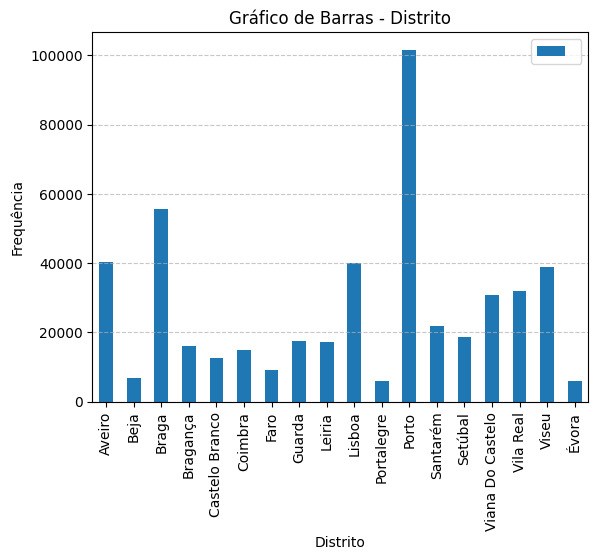

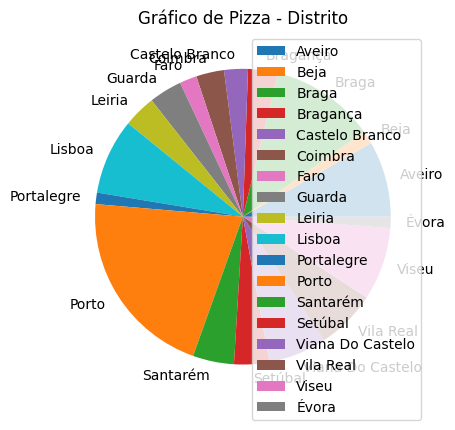


Análise da variável: Concelho

                             Frequência Absoluta Frequência Relativa (%)
Concelho                                                                
Abrantes                                    1960                   0.4 %
Aguiar Da Beira                              436                  0.09 %
Alandroal                                    327                  0.07 %
Albergaria-a-velha                          2457                  0.51 %
Albufeira                                    798                  0.16 %
Alcanena                                     918                  0.19 %
Alcobaça                                    1923                   0.4 %
Alcochete                                    378                  0.08 %
Alcoutim                                     202                  0.04 %
Alcácer Do Sal                               788                  0.16 %
Alenquer                                    3821                  0.79 %
Alfândega Da Fé    

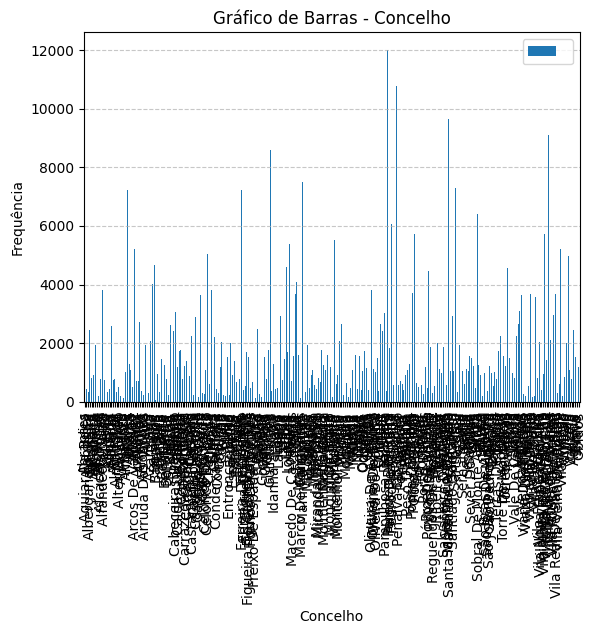

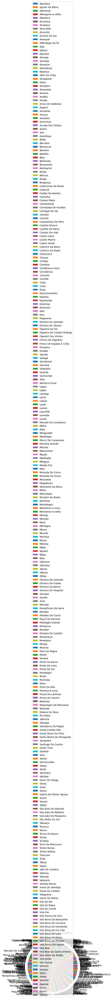


Análise da variável: Freguesia

                                                    Frequência Absoluta  \
Freguesia                                                                 
A Dos Cunhados                                                      288   
A Dos Francos                                                        60   
A Dos Negros                                                         60   
A Ver-o-mar                                                         137   
Abade De Neiva                                                       58   
Abade De Vermoim                                                     28   
Abadim                                                               80   
Abambres                                                             27   
Abaças                                                               89   
Abação (são Tomé)                                                   163   
Abedim                                                             

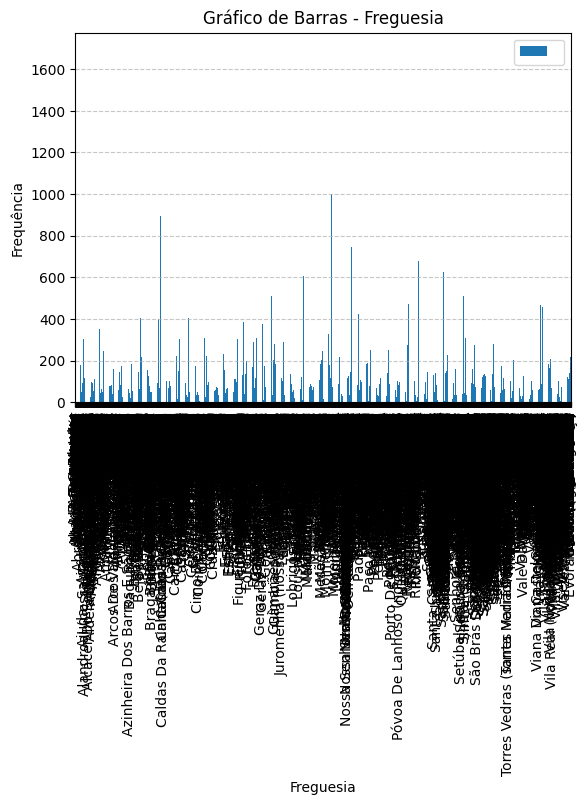


Análise da variável: Nut2

          Frequência Absoluta Frequência Relativa (%)
Nut2                                                 
Alentejo                34808                  7.15 %
Algarve                  9149                  1.88 %
Centro                 126912                 26.09 %
Lisboa                  39269                  8.07 %
Norte                  276356                 56.81 %


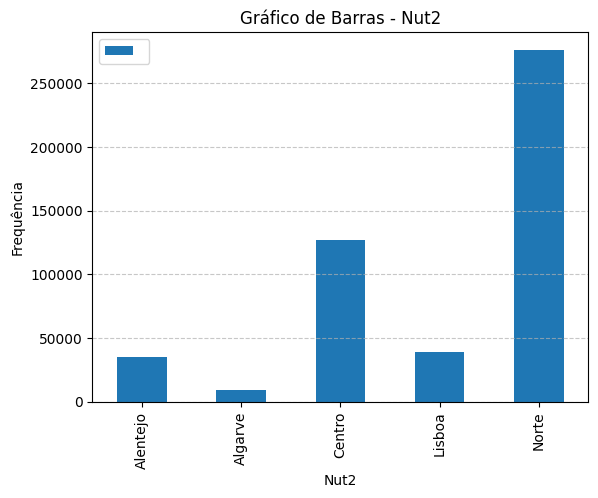

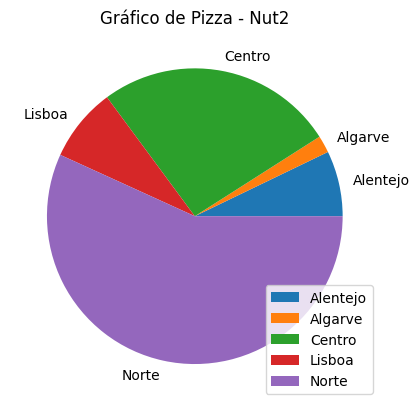


Análise da variável: Fogacho

         Frequência Absoluta Frequência Relativa (%)
Fogacho                                             
Não                   161031                 33.09 %
Sim                   325684                 66.91 %


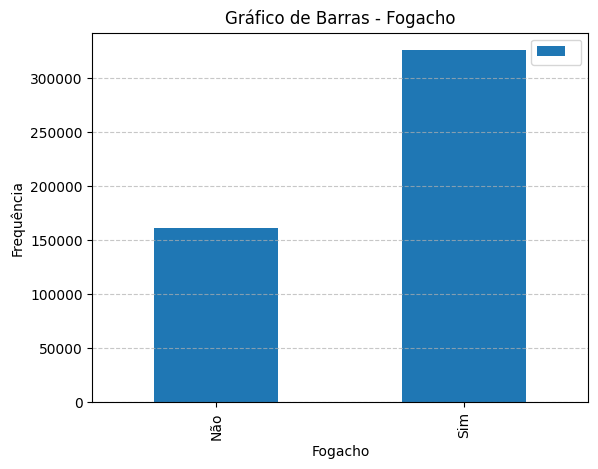

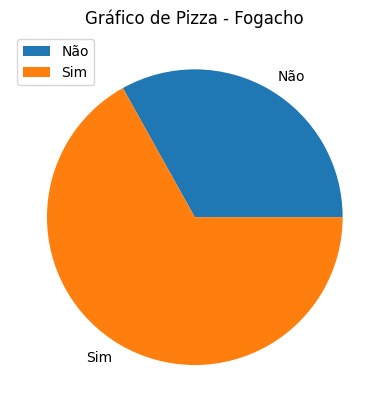


Análise da variável: Agricola

          Frequência Absoluta Frequência Relativa (%)
Agricola                                             
Não                    410074                 84.25 %
Sim                     76641                 15.75 %


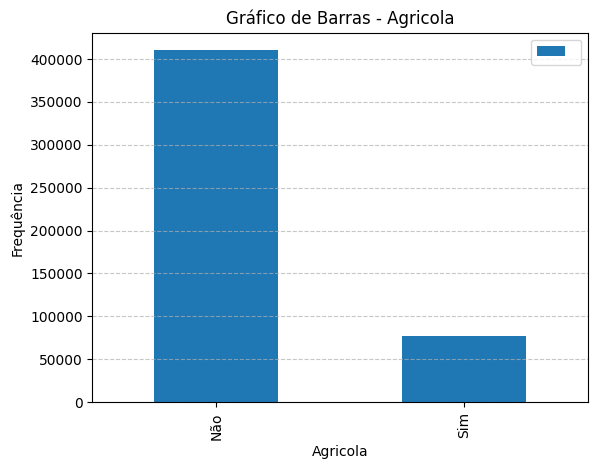

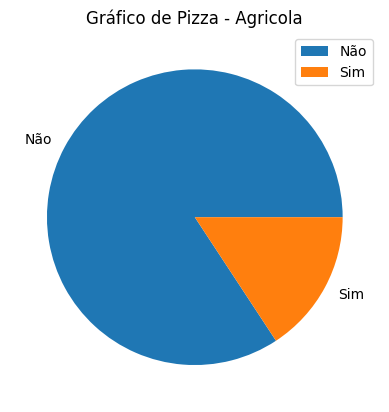


Análise da variável: Reacendimentos

                Frequência Absoluta Frequência Relativa (%)
Reacendimentos                                             
Não                          458303                 94.16 %
Sim                           28412                  5.84 %


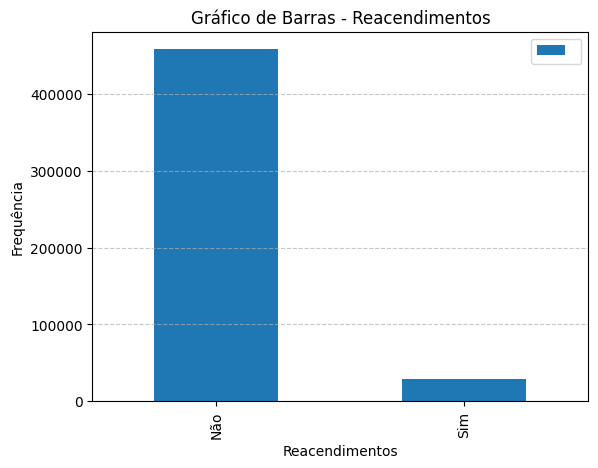

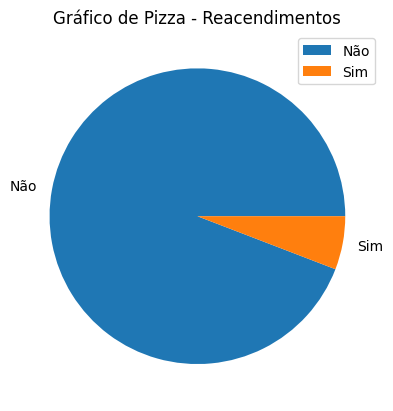


Análise da variável: OriginouReacendimento

                       Frequência Absoluta Frequência Relativa (%)
OriginouReacendimento                                             
Não                                 473576                  97.3 %
Sim                                  13139                   2.7 %


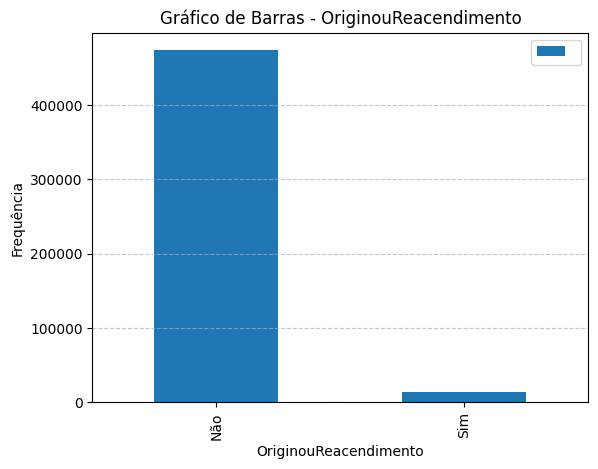

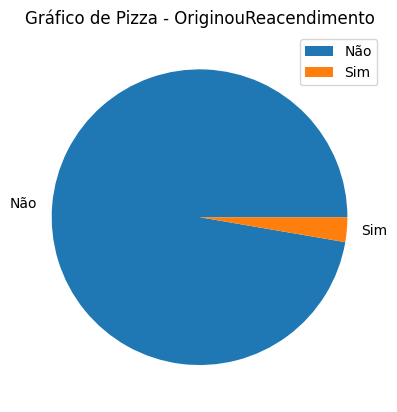

In [38]:
variaveis_qualitativas = ['Tipo', 'ClasseArea', 'FonteAlerta', 'TipoCausa', 'GrupoCausa', 'Distrito', 'Concelho', 'Freguesia', 'Nut2', 'Fogacho', 'Agricola', 'Reacendimentos', 'OriginouReacendimento']

analisar_qualitativas(dataset, variaveis_qualitativas)

### 2.3.3 - Análise exploratória das variáveis Temporais
A função analisar_tempo converte a coluna de data para o formato datetime, extrai informações de mês, hora e ano, exibe gráficos de barras com a distribuição mensal e horária dos incêndios.

In [39]:
def analisar_tempo(dataset, col_data='DHInicio'):
    # Converter coluna de data/hora porque veio num formato .csv
    dataset[col_data] = pd.to_datetime(dataset[col_data], errors='coerce')

    # Criar colunas de tempo com dataset na DHInicio
    dataset['Mes'] = dataset[col_data].dt.month
    dataset['Hora'] = dataset[col_data].dt.hour
    dataset['Ano'] = dataset[col_data].dt.year

    # Agrupamento por mês e hora
    agrupado_mes = dataset['Mes'].value_counts().sort_index()
    agrupado_hora = dataset['Hora'].value_counts().sort_index()

    # Gráfico de barras - Mês
    agrupado_mes.plot(kind="bar", legend=False)
    plt.title("Gráfico de Barras - Mês")
    plt.xlabel("Mês")
    plt.ylabel("Frequência")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # Gráfico de barras - Hora
    agrupado_hora.plot(kind="bar", legend=False)
    plt.title("Gráfico de Barras - Hora do Dia")
    plt.xlabel("Hora")
    plt.ylabel("Frequência")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

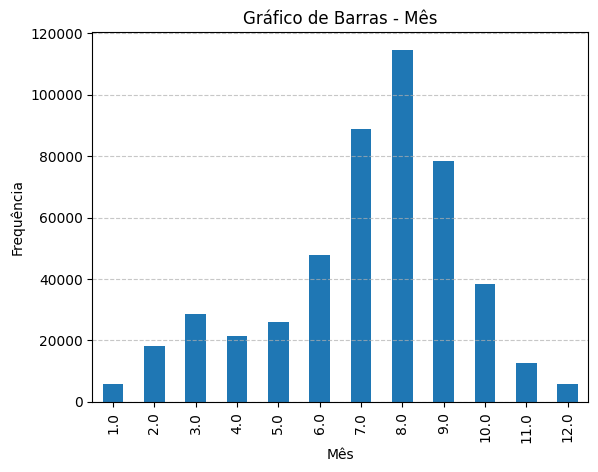

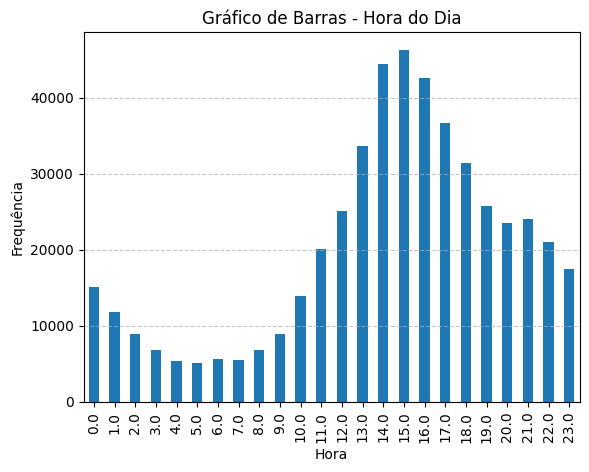

In [40]:
analisar_tempo(dataset)


### 2.3.4 - Investigação de Subgrupos
Nesta secção são analisados diferentes subgrupos de variáveis com base na Tabela 7 do capítulo 2.3.4 Investigação de subgrupos, com o objetivo de compreender melhor os padrões associados à área ardida, número de incêndios e condições que favorecem a sua propagação.
Cada subgrupo cruza variáveis relevantes como o tipo de incêndio, causas, reacendimentos, localização e condições meteorológicas, permitindo gerar tabelas resumo e gráficos explicativos que suportam a formulação de hipóteses.

Para tornar os títulos e eixos dos gráficos mais claros e legíveis, foi criado um dicionário de nomes legíveis, que traduz os nomes técnicos das colunas da base de dados para expressões mais compreensíveis em português.

In [41]:
# Dicionário

nomes_legiveis = {
    'Tipo': 'Tipo de Incêndio',
    'ClasseArea': 'Classe de Área Ardida',
    'TipoCausa': 'Tipo de Causa',
    'Distrito': 'Distrito',
    'Ano': 'Ano',
    'Reacendimentos': 'Reacendimentos',
    'TempoRescaldo': 'Tempo de Rescaldo',
    'Faixa': 'Faixa',
    'ClasseFWI': 'Classe de FWI',
    'Hora': 'Hora do Dia',
    'Mes': 'Mês',
    'AreaTotal': 'Área Ardida Total'
}

A função **analisar_subgrupo_categorizado** agrupa os dados com base em duas variáveis categóricas, calcula o número de incêndios e a soma da área ardida, e gera gráficos de barras empilhadas com títulos e rótulos legíveis definidos pelo dicionário nomes_legiveis.

In [42]:
def analisar_subgrupo_categorizado(dataset, var1, var2, area_var='AreaTotal'):
    frequencia = dataset.groupby([var1, var2]).size().unstack(fill_value=0)
    area_total = dataset.groupby([var1, var2])[area_var].sum().unstack(fill_value=0)

    tabela_cruzada = pd.DataFrame({
        'Nº Incêndios': dataset.groupby([var1, var2]).size(),
        f'{nomes_legiveis.get(area_var, area_var)} (ha)': dataset.groupby([var1, var2])[area_var].sum()
    }).reset_index()

    display(tabela_cruzada)

    freq_titulo = f"Nº de Incêndios por {nomes_legiveis.get(var2, var2)} e {nomes_legiveis.get(var1, var1)}"
    area_titulo = f"{nomes_legiveis.get(area_var, area_var)} por {nomes_legiveis.get(var2, var2)} e {nomes_legiveis.get(var1, var1)}"

    frequencia.T.plot(kind='bar', stacked=True, figsize=(10, 5))
    plt.title(freq_titulo)
    plt.xlabel(nomes_legiveis.get(var2, var2))
    plt.ylabel("Nº de Incêndios")
    plt.legend(title=nomes_legiveis.get(var1, var1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    area_total.T.plot(kind='bar', stacked=True, figsize=(10, 5))
    plt.title(area_titulo)
    plt.xlabel(nomes_legiveis.get(var2, var2))
    plt.ylabel("Área Ardida (ha)")
    plt.legend(title=nomes_legiveis.get(var1, var1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


A função **analisar_simples_por_grupo** agrupa os dados por uma variável categórica, calcula o número de ocorrências e a soma da área ardida, e gera dois gráficos de barras separados com títulos e rótulos legíveis baseados no dicionário nomes_legiveis.

In [43]:
def analisar_simples_por_grupo(dataset, var, area_var='AreaTotal'):
    ocorrencias = dataset[var].value_counts().sort_index()
    area_total = dataset.groupby(var)[area_var].sum().sort_index()

    tabela = pd.DataFrame({
        'Nº Incêndios': ocorrencias,
        f'{nomes_legiveis.get(area_var, area_var)} (ha)': area_total
    })

    display(tabela)

    tabela['Nº Incêndios'].plot(kind='bar', figsize=(10, 5), color='skyblue')
    plt.title(f"Nº de Incêndios por {nomes_legiveis.get(var, var)}")
    plt.xlabel(nomes_legiveis.get(var, var))
    plt.ylabel("Nº de Incêndios")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    tabela[f'{nomes_legiveis.get(area_var, area_var)} (ha)'].plot(kind='bar', figsize=(10, 5), color='salmon')
    plt.title(f"{nomes_legiveis.get(area_var, area_var)} por {nomes_legiveis.get(var, var)}")
    plt.xlabel(nomes_legiveis.get(var, var))
    plt.ylabel("Área Ardida (ha)")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


A função **analisar_reacendimentos** cruza a variável binária Reacendimentos com outra variável categórica, gera uma tabela de frequência e um gráfico de barras com rótulos legíveis baseados no dicionário nomes_legiveis.

In [44]:
def analisar_reacendimentos(dataset, var_categ):
    dataset_copia = dataset.copy()

    # Garantir que os valores são 0/1 antes da substituição
    if dataset_copia['Reacendimentos'].dropna().isin([0, 1]).all():
        dataset_copia['Reacendimentos'] = dataset_copia['Reacendimentos'].map({0: 'Não', 1: 'Sim'})
    else:
        print("⚠ A coluna 'Reacendimentos' não contém apenas 0 e 1. Verifica os dados.")
        print(dataset_copia['Reacendimentos'].unique())
        return

    tabela = dataset_copia.groupby(['Reacendimentos', var_categ]).size().unstack(fill_value=0)
    display(tabela)

    tabela.T.plot(kind='bar', figsize=(10, 5))
    plt.title(f"{nomes_legiveis.get('Reacendimentos')} × {nomes_legiveis.get(var_categ, var_categ)}")
    plt.xlabel(nomes_legiveis.get(var_categ, var_categ))
    plt.ylabel("Nº de Ocorrências")
    plt.legend(title='Reacendimentos')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


A função **analisar_bins_continuos** agrupa uma variável contínua em faixas (bins), calcula a soma da área ardida em cada faixa e gera um gráfico de barras com títulos e rótulos legíveis definidos pelo dicionário nomes_legiveis.

In [45]:
def analisar_bins_continuos(dataset, var_bin, area_var='AreaTotal', bins=None, labels=None, titulo=''):
    dataset['Faixa'] = pd.cut(dataset[var_bin], bins=bins, labels=labels, right=False)
    agrupado = dataset.groupby('Faixa', observed=True)[area_var].sum().sort_values(ascending=False)


    display(agrupado)

    titulo = titulo or f"{nomes_legiveis.get(area_var, area_var)} por Faixa de {nomes_legiveis.get(var_bin, var_bin)}"

    agrupado.plot(kind='bar', color='firebrick', figsize=(10, 5))
    plt.title(titulo)
    plt.xlabel(nomes_legiveis.get('Faixa', 'Faixa'))
    plt.ylabel("Área Ardida (ha)")
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

,Tipo,ClasseArea,Nº Incêndios,Área Ardida Total (ha)
0,Agrícola,[Area+1000],1,2.382000e+03
1,Agrícola,[Area-1],79718,8.461566e+03
2,Agrícola,[Area-50-100],61,4.207600e+03
3,Agrícola,[Area1-10],5378,1.513821e+04
4,Agrícola,[Area10-50],486,9.690355e+03
5,Agrícola,[Area100-500],31,6.015520e+03
6,Agrícola,[Area500-1000],1,6.420000e+02
7,Florestal,[Area+1000],472,1.757369e+06
8,Florestal,[Area-1],335586,5.581115e+04
9,Florestal,[Area-50-100],2120,1.523233e+05


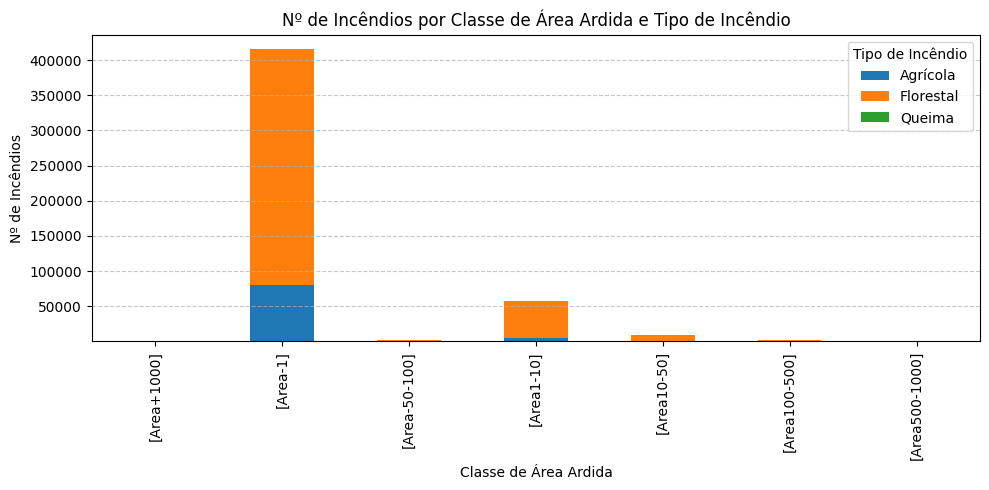

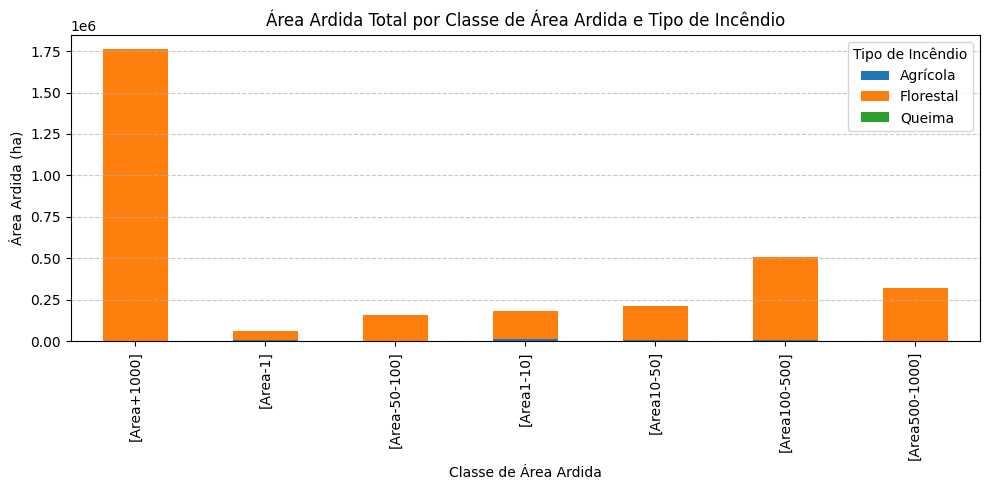

,TipoCausa,ClasseArea,Nº Incêndios,Área Ardida Total (ha)
0,Desconhecida,[Area+1000],76,254864.293067
1,Desconhecida,[Area-1],70354,9646.719543
2,Desconhecida,[Area-50-100],429,30851.526382
3,Desconhecida,[Area1-10],8887,28563.714019
4,Desconhecida,[Area10-50],1742,39915.531026
5,Desconhecida,[Area100-500],455,98457.055164
6,Desconhecida,[Area500-1000],76,53234.973485
7,Intencional,[Area+1000],177,672777.770371
8,Intencional,[Area-1],34834,6888.502220
9,Intencional,[Area-50-100],532,38125.637077


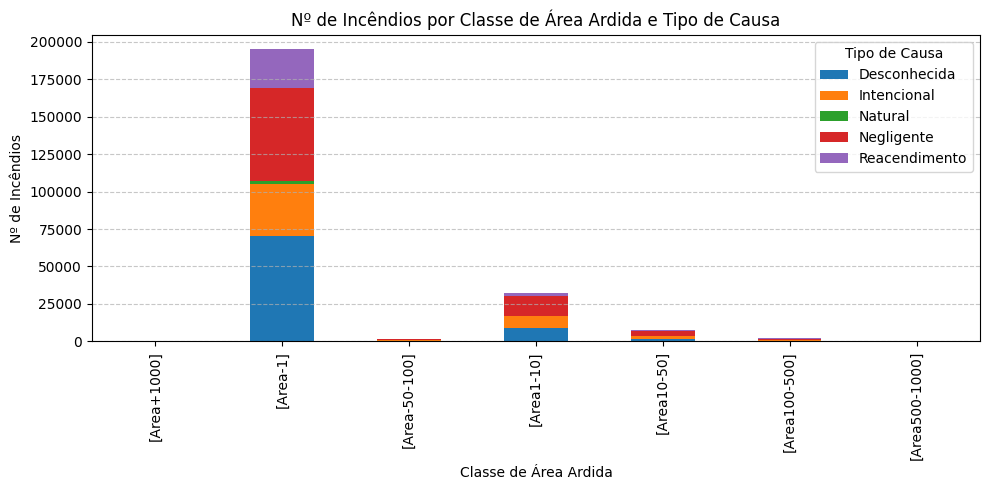

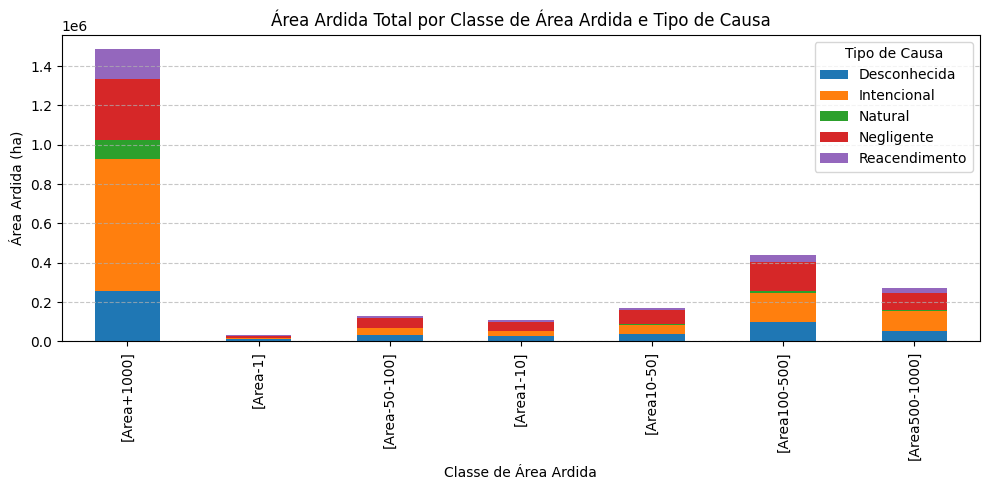

,Nº Incêndios,Área Ardida Total (ha)
Distrito,,
Aveiro,40338,142612.398243
Beja,6937,78332.917117
Braga,55697,174911.714299
Bragança,15947,201985.714961
Castelo Branco,12637,356743.776069
Coimbra,14869,232137.860454
Faro,9149,188048.512717
Guarda,17548,359783.351528
Leiria,17244,150987.015841


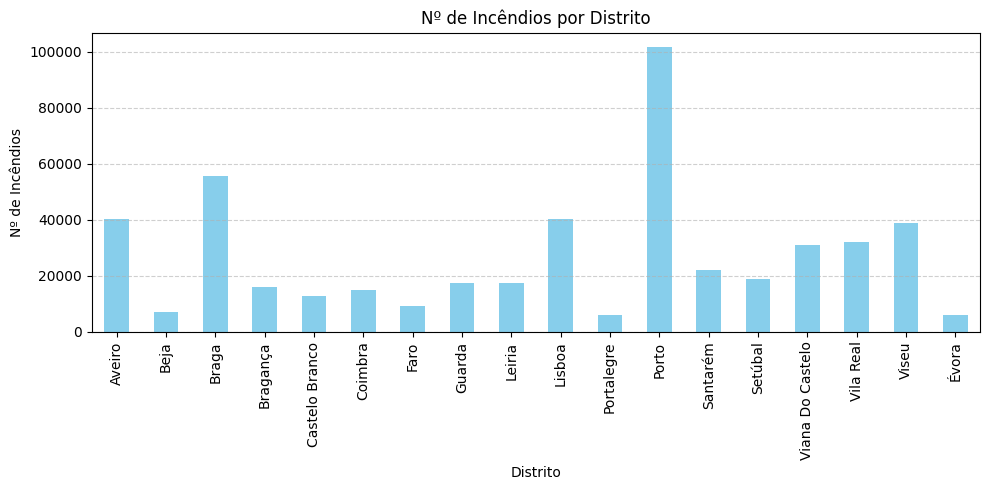

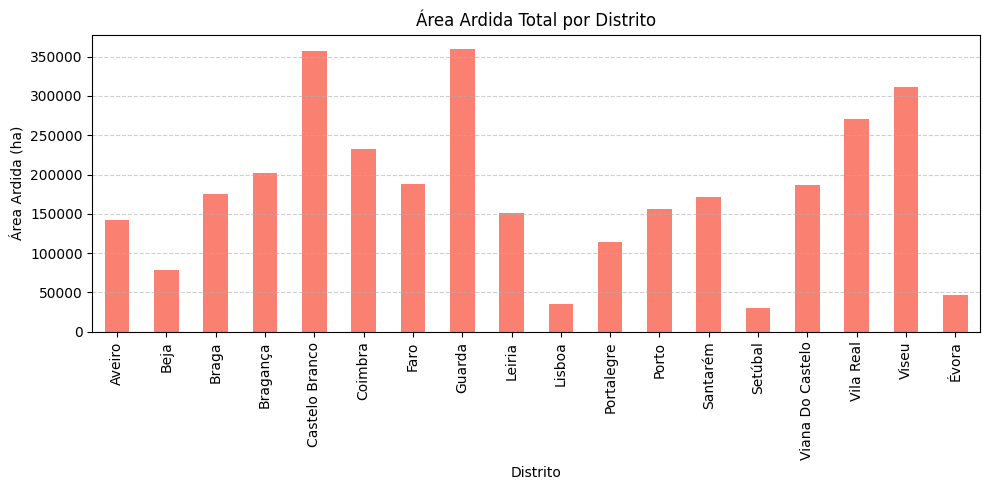

,Ano,Tipo,Nº Incêndios,Área Ardida Total (ha)
0,2001.0,Agrícola,1967,708.601210
1,2001.0,Florestal,26856,116336.152247
2,2002.0,Agrícola,2489,1118.032200
3,2002.0,Florestal,26431,129416.057050
4,2003.0,Agrícola,1695,1119.986420
5,2003.0,Florestal,23711,468477.671011
6,2004.0,Agrícola,5808,3168.248710
7,2004.0,Florestal,21921,148160.904100
8,2005.0,Agrícola,5973,2159.212600
9,2005.0,Florestal,35592,344335.320432


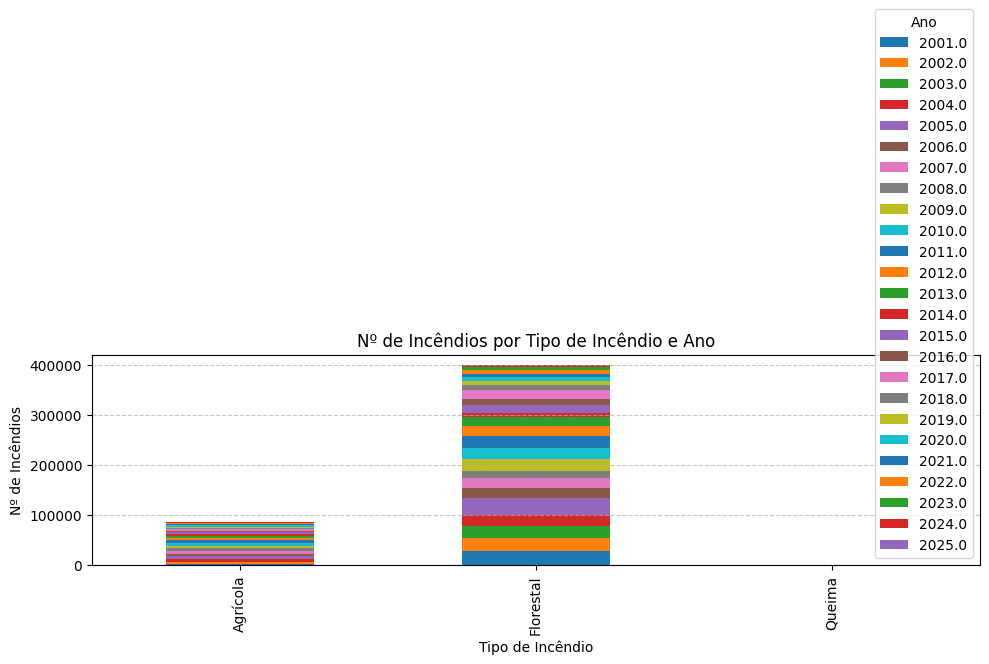

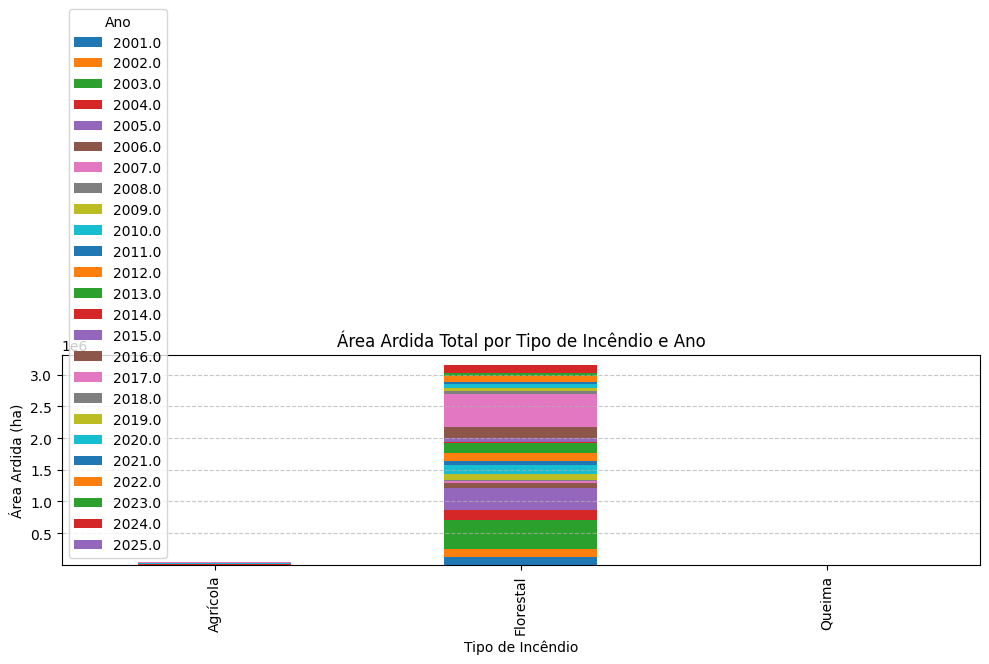

⚠ A coluna 'Reacendimentos' não contém apenas 0 e 1. Verifica os dados.
['Não' 'Sim']
⚠ A coluna 'Reacendimentos' não contém apenas 0 e 1. Verifica os dados.
['Não' 'Sim']


,Nº Incêndios,Área Ardida Total (ha)
ClasseArea,,
[Area+1000],473,1.759751e+06
[Area-1],415310,6.427872e+04
[Area-50-100],2181,1.565309e+05
[Area1-10],56796,1.826770e+05
[Area10-50],9156,2.106110e+05
[Area100-500],2341,5.110755e+05
[Area500-1000],458,3.226635e+05


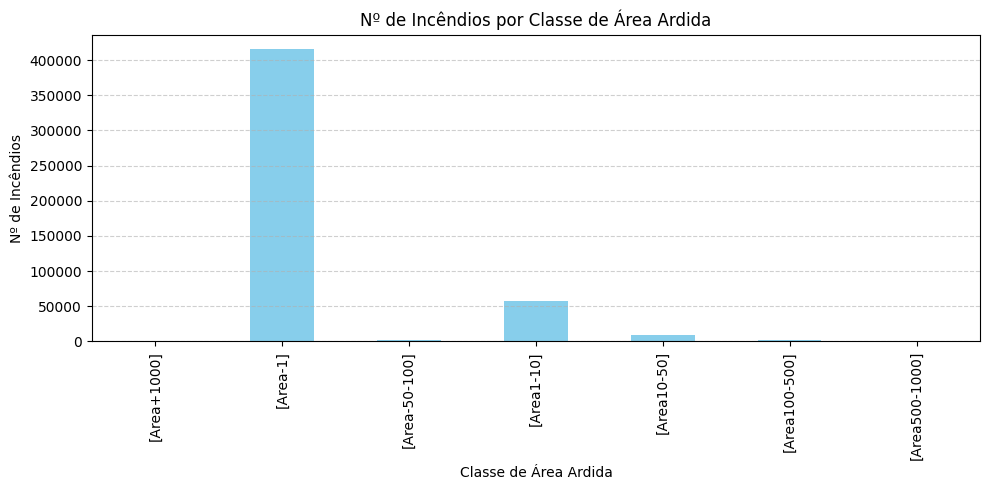

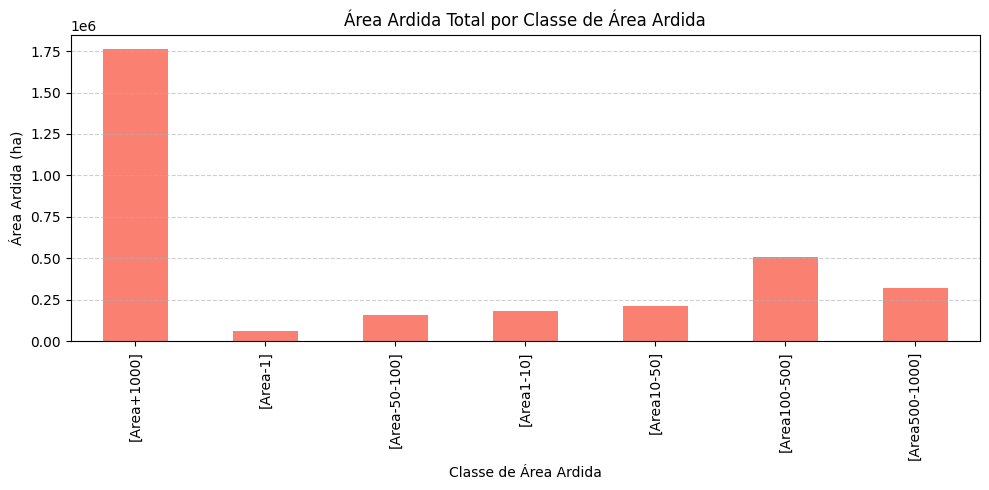

,AreaTotal
Faixa,
1-2h,2.209895e+06
>24h,2.162711e+05
8-24h,2.116320e+05
10-30min,1.660777e+05
4-8h,1.233348e+05
2-4h,1.018634e+05
0-10min,9.305784e+04
30-60min,8.545654e+04


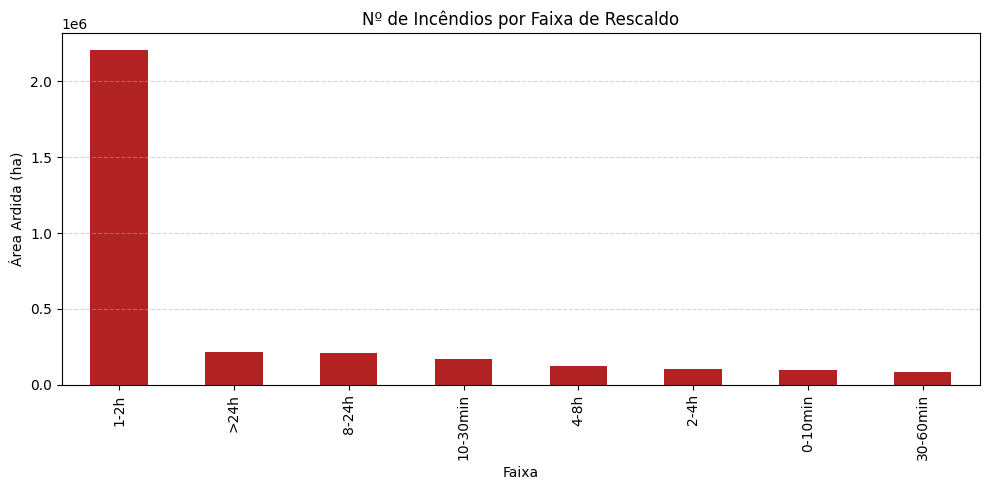

,AreaTotal
Faixa,
Elevado,1.668071e+06
Muito Elevado,5.760490e+05
Moderado,5.565146e+05
Baixo,1.735706e+05
Extremo,1.469131e+05
Muito Baixo,4.903450e+04
Severo,3.739942e+04


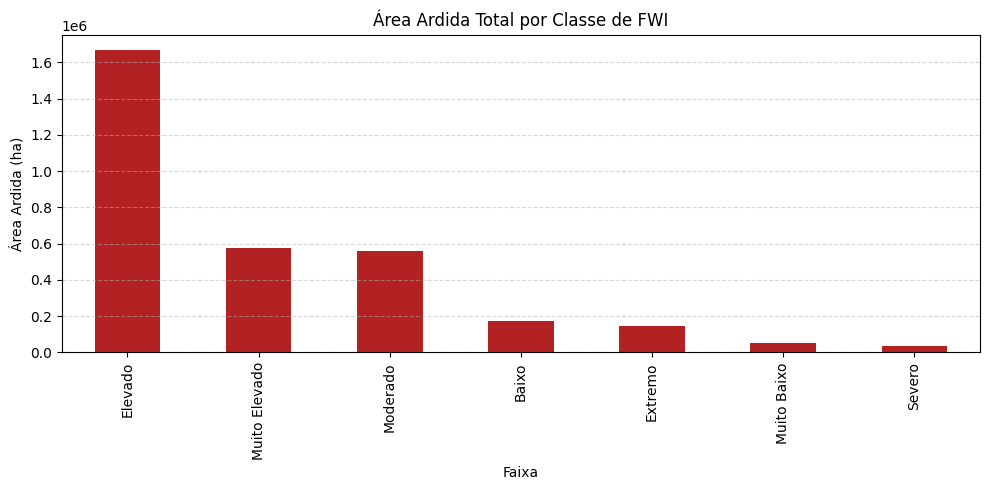

In [46]:
# Subgrupo 1 - Tipo de incêndio × Classe de área ardida
analisar_subgrupo_categorizado(dataset, 'Tipo', 'ClasseArea')

# Subgrupo 2 - Tipo de causa × Classe de área ardida
analisar_subgrupo_categorizado(dataset, 'TipoCausa', 'ClasseArea')

# Subgrupo 3 - Distrito × Número de incêndios / Área ardida
analisar_simples_por_grupo(dataset, 'Distrito')

# Subgrupo 4 - Ano × Tipo de incêndio
analisar_subgrupo_categorizado(dataset, 'Ano', 'Tipo')

# Subgrupo 5 - Reacendimentos × Tipo de incêndio
analisar_reacendimentos(dataset, 'Tipo')

# Subgrupo 5 (parte 2) - Reacendimentos × Tipo de causa
analisar_reacendimentos(dataset, 'TipoCausa')

# Subgrupo 6 - Número de reacendimentos × Classe de área
analisar_simples_por_grupo(dataset, 'ClasseArea')  # Supõe-se que o dataset['Reacendimentos'] já é considerado na criação de ClasseArea ou nas análises

# Subgrupo 7 - Tempo de rescaldo × Reacendimentos
bins = [0, 10, 30, 60, 120, 240, 480, 1440, 100000]
labels = ['0-10min', '10-30min', '30-60min', '1-2h', '2-4h', '4-8h', '8-24h', '>24h']
analisar_bins_continuos(dataset, 'TempoRescaldo', bins=bins, labels=labels,
                        titulo='Nº de Incêndios por Faixa de Rescaldo')

# Subgrupo 8 - Índices meteorológicos × Área ardida
bins = [0, 5, 15, 30, 50, 70, 90, 110, 200]
labels = ['Muito Baixo', 'Baixo', 'Moderado', 'Elevado', 'Muito Elevado', 'Extremo', 'Severo', 'Crítico']
analisar_bins_continuos(dataset, 'fwi', bins=bins, labels=labels,
                        titulo='Área Ardida Total por Classe de FWI')


### Etapa 4 - Verificação da qualidade dos dados

### 2.4 - Qualidade dos dados

In [47]:
# Imprime o nome de todas as colunas do dataset, útil para conhecer a estrutura dos dados
print(dataset.columns)

Index(['Unnamed: 0', 'Codigo', 'CodigoSado', 'Ano', 'Tipo', 'DHInicio',
       'DH1Intervencao', 'DHResolucao', 'DHConclusao', 'DHFim',
       ...
       'DistIncSimul500090', 'AreaTotalIncSimul500090', 'Fogacho', 'Agricola',
       'Reacendimentos', 'ClassificacaoRegisto', 'EstadoRegisto',
       'DHFimEstimado', 'Observacoes', 'Faixa'],
      dtype='object', length=101)


Identificar colunas com valores nulos (NaN) no dataset

In [48]:
# Verifica e exibe a contagem de valores ausentes (NaN) por coluna
dataset.isnull().sum()

,0
Unnamed: 0,0
Codigo,0
CodigoSado,189
Ano,675
Tipo,0
DHInicio,675
DH1Intervencao,211798
DHResolucao,345673
DHConclusao,223161
DHFim,38


Identificar linhas que são cópias exatas de outras no dataset

In [49]:
# Filtra e retorna todas as linhas duplicadas do dataset (linhas idênticas a outras anteriores)
dataset[dataset.duplicated()]

,Unnamed: 0,Codigo,CodigoSado,Ano,Tipo,DHInicio,DH1Intervencao,DHResolucao,DHConclusao,DHFim,DuracaoHoras,Tempo1Intervencao,TempoResolucao,TempoRescaldo,Dia,Mes,Hora,AreaPov,AreaMato,AreaAgric,AreaTotal,HaHora,ClasseArea,FonteAlerta,CodCausa,TipoCausa,GrupoCausa,DescricaoCausa,Reacendimento_IncendioPai,OriginouReacendimento,Distrito,Concelho,Freguesia,Local,Nut2,Nut3,INE,Perimetro,APS,x_20790,y_20790,Lat_4326,Lon_4326,x_3763,y_3763,QO,ModFarsite,AreaManchaModFarsite,AltitudeMedia,DecliveMedio,HorasExposicaoMedia,Rugosidade,DendidadeRV,CosN5Variedade,Perigosidade,Dist_CBS_m,CBS,DensidadeResidentes,DensidadeEdificios,Temperatura,HumidadeRelativa,VentoIntensidade,VentoIntensidade_vetor,VentoDirecao_vetor,Precepitacao,VentoDirecao,fwi,dsr,isi,dc,dmc,ffmc,bui,hFWI,hFFMC,hISI,RCM,MaxFWIh_48h_PosExtincao,MaxFFMCh_48h_PosExtincao,MaxISIh_48h_PosExtincao,MaxDC_48h_DiaPosExtincao,MaxBUI_48h_PosExtincao,MaxDMC_48h_PosExtincao,NIncSimul5000,DistIncSimul5000,AreaTotalIncSimul5000,NIncSimulDistrito,NIncSimulConcelho,NIncSimulDistrito90,NIncSimulConcelho90,NIncSimul500090,DistIncSimul500090,AreaTotalIncSimul500090,Fogacho,Agricola,Reacendimentos,ClassificacaoRegisto,EstadoRegisto,DHFimEstimado,Observacoes,Faixa


Verifica se há valores negativos em variáveis onde não faz sentido

In [50]:
# Analisar colunas numéricas à procura de valores negativos
def analisar_numericas(dataset, lista_colunas):
    print("Contagem de valores negativos por variável:\n")

    for coluna in lista_colunas:
        if coluna in dataset.columns:
            # Ver se a coluna é de tipo numérico
            if pd.api.types.is_numeric_dtype(dataset[coluna]):
                num_negativos = (dataset[coluna] < 0).sum()
                print(f"{coluna}: {num_negativos} valores negativos")
            else:
                print(f"{coluna}: coluna não numérica (tipo: {dataset[coluna].dtype})")
        else:
            print(f"{coluna}: coluna não encontrada no dataset")

In [51]:
# Lista de colunas numéricas a serem analisadas
colunas = ['Ano','DuracaoHoras','Tempo1Intervencao','TempoResolucao','TempoRescaldo','Dia','Mes','Hora','AreaPov', 'AreaMato', 'AreaAgric', 'AreaTotal','HaHora','CodCausa',
           'DecliveMedio','HorasExposicaoMedia','Rugosidade','Perigosidade','Dist_CBS_m','DensidadeResidentes','DensidadeEdificios','Temperatura',
           'HumidadeRelativa','VentoIntensidade','Precepitacao','fwi','dsr','isi','dc','dmc','ffmc','bui','MaxFWIh_48h_PosExtincao','MaxFFMCh_48h_PosExtincao','MaxISIh_48h_PosExtincao',
           'AreaTotalIncSimul5000','NIncSimulDistrito','NIncSimulConcelho','Reacendimentos']

# Executa a função para analisar possíveis valores negativos nessas colunas
analisar_numericas(dataset, colunas)

Contagem de valores negativos por variável:

Ano: 0 valores negativos
DuracaoHoras: 0 valores negativos
Tempo1Intervencao: 0 valores negativos
TempoResolucao: 0 valores negativos
TempoRescaldo: 0 valores negativos
Dia: 0 valores negativos
Mes: 0 valores negativos
Hora: 0 valores negativos
AreaPov: 0 valores negativos
AreaMato: 0 valores negativos
AreaAgric: 0 valores negativos
AreaTotal: 0 valores negativos
HaHora: 0 valores negativos
CodCausa: 0 valores negativos
DecliveMedio: 0 valores negativos
HorasExposicaoMedia: 0 valores negativos
Rugosidade: 0 valores negativos
Perigosidade: 7856 valores negativos
Dist_CBS_m: 0 valores negativos
DensidadeResidentes: 0 valores negativos
DensidadeEdificios: 0 valores negativos
Temperatura: 273 valores negativos
HumidadeRelativa: 0 valores negativos
VentoIntensidade: 0 valores negativos
Precepitacao: 71319 valores negativos
fwi: 22 valores negativos
dsr: 0 valores negativos
isi: 22 valores negativos
dc: 22 valores negativos
dmc: 22 valores negativ

Verifica se determinadas colunas possuem apenas dois valores distintos (binárias)

In [52]:
# verificar se colunas são binárias e contar os valores distintos
def analisar_binarias(dataset, lista_colunas_binarias):
    print("Verificação de colunas binárias:\n")

    for coluna in lista_colunas_binarias:
        if coluna in dataset.columns:
            # Remove valores ausentes (NaN) e identifica os valores únicos
            valores_unicos = dataset[coluna].dropna().unique()
            num_valores = len(valores_unicos)

            print(f"{coluna}:")
            print(f"  Valores únicos: {sorted(valores_unicos)}")

            # Verifica se a coluna é binária (exatamente 2 valores)
            if num_valores != 2:
                print(f"  Coluna NÃO é estritamente binária ({num_valores} valores encontrados)\n")
            else:
                # Conta quantos registos há de cada valor
                contagem = dataset[coluna].value_counts(dropna=True)
                for valor, count in contagem.items():
                    print(f"  {valor}: {count}")
                print()
        else:
            print(f"{coluna}: Coluna não encontrada no dataset\n")

In [53]:
# Lista de colunas esperadas como binárias
colunas_binarias = ['OriginouReacendimento', 'Fogacho', 'Agricola']

# Chamada da função para análise
analisar_binarias(dataset, colunas_binarias)

Verificação de colunas binárias:

OriginouReacendimento:
  Valores únicos: ['Não', 'Sim']
  Não: 473576
  Sim: 13139

Fogacho:
  Valores únicos: ['Não', 'Sim']
  Sim: 325684
  Não: 161031

Agricola:
  Valores únicos: ['Não', 'Sim']
  Não: 410074
  Sim: 76641



Identifica possíveis erros nos campos de mês e hora

In [54]:
# Filtra e imprime as linhas onde o valor da coluna 'Mes' é maior que 12 (o que é inválido para um mês)
print("Registos com valor inválido na coluna 'Mes' (> 12):")
print(dataset[dataset['Mes'] > 12])

Registos com valor inválido na coluna 'Mes' (> 12):
Empty DataFrame
Columns: [Unnamed: 0, Codigo, CodigoSado, Ano, Tipo, DHInicio, DH1Intervencao, DHResolucao, DHConclusao, DHFim, DuracaoHoras, Tempo1Intervencao, TempoResolucao, TempoRescaldo, Dia, Mes, Hora, AreaPov, AreaMato, AreaAgric, AreaTotal, HaHora, ClasseArea, FonteAlerta, CodCausa, TipoCausa, GrupoCausa, DescricaoCausa, Reacendimento_IncendioPai, OriginouReacendimento, Distrito, Concelho, Freguesia, Local, Nut2, Nut3, INE, Perimetro, APS, x_20790, y_20790, Lat_4326, Lon_4326, x_3763, y_3763, QO, ModFarsite, AreaManchaModFarsite, AltitudeMedia, DecliveMedio, HorasExposicaoMedia, Rugosidade, DendidadeRV, CosN5Variedade, Perigosidade, Dist_CBS_m, CBS, DensidadeResidentes, DensidadeEdificios, Temperatura, HumidadeRelativa, VentoIntensidade, VentoIntensidade_vetor, VentoDirecao_vetor, Precepitacao, VentoDirecao, fwi, dsr, isi, dc, dmc, ffmc, bui, hFWI, hFFMC, hISI, RCM, MaxFWIh_48h_PosExtincao, MaxFFMCh_48h_PosExtincao, MaxISIh_48

In [55]:
# Filtra e imprime as linhas onde o valor da coluna 'Hora' é maior que 23 (inválido para horas do dia)
print("Registos com valor inválido na coluna 'Hora' (> 23):")
print(dataset[dataset['Hora'] > 23])

Registos com valor inválido na coluna 'Hora' (> 23):
Empty DataFrame
Columns: [Unnamed: 0, Codigo, CodigoSado, Ano, Tipo, DHInicio, DH1Intervencao, DHResolucao, DHConclusao, DHFim, DuracaoHoras, Tempo1Intervencao, TempoResolucao, TempoRescaldo, Dia, Mes, Hora, AreaPov, AreaMato, AreaAgric, AreaTotal, HaHora, ClasseArea, FonteAlerta, CodCausa, TipoCausa, GrupoCausa, DescricaoCausa, Reacendimento_IncendioPai, OriginouReacendimento, Distrito, Concelho, Freguesia, Local, Nut2, Nut3, INE, Perimetro, APS, x_20790, y_20790, Lat_4326, Lon_4326, x_3763, y_3763, QO, ModFarsite, AreaManchaModFarsite, AltitudeMedia, DecliveMedio, HorasExposicaoMedia, Rugosidade, DendidadeRV, CosN5Variedade, Perigosidade, Dist_CBS_m, CBS, DensidadeResidentes, DensidadeEdificios, Temperatura, HumidadeRelativa, VentoIntensidade, VentoIntensidade_vetor, VentoDirecao_vetor, Precepitacao, VentoDirecao, fwi, dsr, isi, dc, dmc, ffmc, bui, hFWI, hFFMC, hISI, RCM, MaxFWIh_48h_PosExtincao, MaxFFMCh_48h_PosExtincao, MaxISIh_4

Identifica valores com formato inválido nas colunas de data

In [56]:
# Lista de colunas de data a verificar
colunas_data = ['DHInicio', 'DH1Intervencao', 'DHResolucao', 'DHConclusao', 'DHFim']

# Dicionário para armazenar os casos inválidos por coluna
datas_invalidas = {}

# Percorre cada coluna de data
for coluna in colunas_data:
    # Converte os valores da coluna para datetime (sem alterar o dataset original)
    datas_convertidas = pd.to_datetime(dataset[coluna], format="%d/%m/%Y %H:%M", errors='coerce')

    # Identifica linhas onde a conversão falhou (NaT) mas havia um valor original
    linhas_invalidas = dataset[datas_convertidas.isna() & dataset[coluna].notna()]

    # Guarda a contagem de valores inválidos
    datas_invalidas[coluna] = linhas_invalidas.shape[0]

# Mostra o total de valores com formato inválido por coluna
print("Número de datas com formato inválido por coluna:")
for coluna, count in datas_invalidas.items():
    print(f"{coluna}: {count}")

Número de datas com formato inválido por coluna:
DHInicio: 0
DH1Intervencao: 274917
DHResolucao: 141042
DHConclusao: 263554
DHFim: 486677


Verificações de Consistência Temporal no Dataset de Incêndios

Validamos se as datas seguem uma ordem lógica e se os cálculos derivados (ex: duração) são consistentes com os campos originais.

In [57]:
# Filtra casos onde qualquer uma das datas é superior a DHFim
datas_superiores_a_fim = dataset[
    (dataset['DHInicio'] > dataset['DHFim']) |
    (dataset['DH1Intervencao'] > dataset['DHFim']) |
    (dataset['DHResolucao'] > dataset['DHFim']) |
    (dataset['DHConclusao'] > dataset['DHFim'])
]

# Conta o número de registos com problema
num_casos_superiores_a_fim = datas_superiores_a_fim.shape[0]

# Exibe o número de registos
print(f"Número de casos onde alguma data é superior a DHFim: {num_casos_superiores_a_fim}")

Número de casos onde alguma data é superior a DHFim: 4089


 Verificação 2: Alguma data é anterior à 'DHInicio'?

In [58]:
# Verifica se alguma das datas (DH1Intervencao, DHResolucao, DHConclusao, DHFim) é inferior a DHInicio
datas_inferiores_a_inicio = dataset[
    (dataset['DH1Intervencao'] < dataset['DHInicio']) |
    (dataset['DHResolucao'] < dataset['DHInicio']) |
    (dataset['DHConclusao'] < dataset['DHInicio']) |
    (dataset['DHFim'] < dataset['DHInicio'])
]

# Conta o número de registos em que alguma data é inferior a DHInicio
num_casos_inferiores_a_inicio = datas_inferiores_a_inicio.shape[0]

# Exibe o número de registos
print(f"Número de casos em que alguma data é inferior a DHInicio: {num_casos_inferiores_a_inicio}")

Número de casos em que alguma data é inferior a DHInicio: 1132


Verificação 3: 'DuracaoHoras' = 'DHFim' - 'DHInicio'?

In [59]:
# Garante que as datas estão no formato datetime
dataset['DHInicio'] = pd.to_datetime(dataset['DHInicio'], format="%d/%m/%Y %H:%M", errors='coerce')
dataset['DHFim'] = pd.to_datetime(dataset['DHFim'], format="%d/%m/%Y %H:%M", errors='coerce')

# Calcula a duração em horas
dataset['DuracaoCalculada'] = (dataset['DHFim'] - dataset['DHInicio']).dt.total_seconds() / 3600

# Verifica as diferenças (usando arredondamento para evitar problemas com casas decimais)
diferencas = dataset[np.abs(dataset['DuracaoCalculada'] - dataset['DuracaoHoras']) > 0.01]

# Mostra o número de registos inconsistentes
print(f"Número de registos onde DuracaoHoras é diferente de DHFim - DHInicio: {diferencas.shape[0]}")

Número de registos onde DuracaoHoras é diferente de DHFim - DHInicio: 0


Validação de Consistência: CodCausa vs TipoCausa

Verifica se cada código de causa ('CodCausa') está sempre associado ao mesmo tipo de causa ('TipoCausa').

In [60]:
# Verifica se para cada 'CodCausa' o 'TipoCausa' é sempre o mesmo
verificacao_codcausa_tipo = dataset.groupby('CodCausa')['TipoCausa'].nunique()

# Filtra os CodCausa com mais de um TipoCausa
codcausa_inconsistentes = verificacao_codcausa_tipo[verificacao_codcausa_tipo > 1]

# Conta quantos CodCausa têm mais de um TipoCausa
num_inconsistentes = codcausa_inconsistentes.count()

# Exibe o número
print(f"Número de CodCausa com diferentes valores de TipoCausa: {num_inconsistentes}")

Número de CodCausa com diferentes valores de TipoCausa: 0


Análise de Reacendimentos e Incêndios Pai

Esta seção verifica a quantidade de reacendimentos registados e quantos incêndios originaram reacendimentos.



In [61]:
# Quantos registos têm um incêndio pai (ou seja, são reacendimentos)
print("Total de reacendimentos registados:", dataset['Reacendimento_IncendioPai'].notna().sum())


Total de reacendimentos registados: 28246


In [62]:
# Quantos incêndios originaram reacendimentos
print("Total de incêndios que originaram reacendimentos:", dataset['OriginouReacendimento'].sum())


Total de incêndios que originaram reacendimentos: NãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoSimNãoNãoSimNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNãoNã